# 02 - Data Understanding: Data Exploration
This notebook performs the data exploration and analysis phase of the pipeline. It loads the original dataset from `data/raw/` folder and perform all the essential steps of the EDA process.

## Import libraries and settings

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from pathlib import Path

from myocardial_infarction_mortality.config import (
    RAW_DATA_DIR,
    RAW_FILENAME,
    FIGURES_DIR,
    FLOAT_FEATURES,
    INT_FEATURES,
    CATEGORICAL_NOMINAL_FEATURES,
    CATEGORICAL_ORDINAL_FEATURES,
    CATEGORICAL_ORDINAL_FEATURES_WITH_ORDER
)
from myocardial_infarction_mortality.utils.io_utils import load_dataset_with_schema

2026-02-11 12:00:23.485 | INFO     | myocardial_infarction_mortality.config:<module>:14 - PROJ_ROOT path is: /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction


In [2]:
input_path : Path = RAW_DATA_DIR / RAW_FILENAME
print(f"Loading dataset at path:\n\t{input_path}")

Loading dataset at path:
	/home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/data/raw/myocardial_infarction_raw.csv


In [3]:
FIGURES_DATA_EXPLORATION_DIR = FIGURES_DIR / "DU_data_exploration"
FIGURES_DATA_EXPLORATION_DIR.mkdir(parents=True, exist_ok=True)

In [4]:
pd.set_option("display.max_columns", None)
plt.rcParams.update({"font.size": 16})
sns.set_style("whitegrid")
sns.set_palette("tab10")

## Data Loading
We begin by loading the myocardial infarction mortality dataset. This is the untouched file downloaded from ucimlrepo.

In [5]:
df: pd.DataFrame = load_dataset_with_schema(
    file_path=input_path,
    delimiter=",",
    header=0,
    index_col=0,
    float_features=FLOAT_FEATURES,
    int_features=INT_FEATURES,
    categorical_nominal_features=CATEGORICAL_NOMINAL_FEATURES,
    categorical_ordinal_features=CATEGORICAL_ORDINAL_FEATURES_WITH_ORDER
)

print(f"Dataset dimension\n"
      f"\t-Number of rows = {df.shape[0]}\n"
      f"\t-Number of cols = {df.shape[1]}")

Dataset dimension
	-Number of rows = 1700
	-Number of cols = 123


Binarize the `LET_IS` target class in `LET_IS_BINARY`, so that `0=ALIVE`, `1=DEAD`

In [6]:
df["LET_IS_BINARY"] = np.where(df["LET_IS"] != 0, 1, 0)
df["LET_IS_BINARY"] = df["LET_IS_BINARY"].astype("category")

## Basic Overview

In [7]:
df.head(10)

,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,IBS_NASL,GB,SIM_GIPERT,DLIT_AG,ZSN_A,nr_11,nr_01,nr_02,nr_03,nr_04,nr_07,nr_08,np_01,np_04,np_05,np_07,np_08,np_09,np_10,endocr_01,endocr_02,endocr_03,zab_leg_01,zab_leg_02,zab_leg_03,zab_leg_04,zab_leg_06,S_AD_KBRIG,D_AD_KBRIG,S_AD_ORIT,D_AD_ORIT,O_L_POST,K_SH_POST,MP_TP_POST,SVT_POST,GT_POST,FIB_G_POST,ant_im,lat_im,inf_im,post_im,IM_PG_P,ritm_ecg_p_01,ritm_ecg_p_02,ritm_ecg_p_04,ritm_ecg_p_06,ritm_ecg_p_07,ritm_ecg_p_08,n_r_ecg_p_01,n_r_ecg_p_02,n_r_ecg_p_03,n_r_ecg_p_04,n_r_ecg_p_05,n_r_ecg_p_06,n_r_ecg_p_08,n_r_ecg_p_09,n_r_ecg_p_10,n_p_ecg_p_01,n_p_ecg_p_03,n_p_ecg_p_04,n_p_ecg_p_05,n_p_ecg_p_06,n_p_ecg_p_07,n_p_ecg_p_08,n_p_ecg_p_09,n_p_ecg_p_10,n_p_ecg_p_11,n_p_ecg_p_12,fibr_ter_01,fibr_ter_02,fibr_ter_03,fibr_ter_05,fibr_ter_06,fibr_ter_07,fibr_ter_08,GIPO_K,K_BLOOD,GIPER_NA,NA_BLOOD,ALT_BLOOD,AST_BLOOD,KFK_BLOOD,L_BLOOD,ROE,TIME_B_S,R_AB_1_n,R_AB_2_n,R_AB_3_n,NA_KB,NOT_NA_KB,LID_KB,NITR_S,NA_R_1_n,NA_R_2_n,NA_R_3_n,NOT_NA_1_n,NOT_NA_2_n,NOT_NA_3_n,LID_S_n,B_BLOK_S_n,ANT_CA_S_n,GEPAR_S_n,ASP_S_n,TIKL_S_n,TRENT_S_n,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS,LET_IS_BINARY
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,77,1,2,1,1,2.0,NaN,3,0.0,7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<NA>,<NA>,180,100,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.7,0.0,138.0,NaN,NaN,NaN,8.0,16.0,4,0,0,1,NaN,NaN,NaN,0.0,0,0,0,0,0,0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,55,1,1,0,0,0.0,0.0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<NA>,<NA>,120,90,0.0,0.0,0.0,0.0,0.0,0.0,4,1,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.5,0.0,132.0,0.38,0.18,NaN,7.8,3.0,2,0,0,0,1.0,0.0,1.0,0.0,0,0,0,1,0,0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,52,1,0,0,0,2.0,NaN,2,0.0,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,150,100,180,100,0.0,0.0,0.0,0.0,0.0,0.0,4,1,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,132.0,0.30,0.11,NaN,10.8,NaN,3,3,0,0,1.0,1.0,1.0,0.0,1,0,0,3,2,2,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,68,0,0,0,0,2.0,NaN,2,0.0,3,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,<NA>,<NA>,120,70,0.0,0.0,0.0,0.0,0.0,0.0,0,1,1,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.9,0.0,146.0,0.75,0.37,NaN,NaN,NaN,2,0,0,1,NaN,NaN,NaN,0.0,0,0,0,0,0,0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0
5,60,1,0,0,0,2.0,NaN,3,0.0,7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,190,100,160,90,0.0,0.0,0.0,0.0,0.0,0.0,4,1,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.5,0.0,132.0,0.45,0.22,NaN,8.3,NaN,9,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,64,1,0,1,2,1.0,NaN,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<NA>,<NA>,140,90,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.45,0.22,NaN,7.2,2.0,2,0,0,0,0.0,1.0,0.0,0.0,0,0,0,0,0,0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0
7,70,1,1,1,2,1.0,NaN,2,0.0,7,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [8]:
df.tail(10)

,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,IBS_NASL,GB,SIM_GIPERT,DLIT_AG,ZSN_A,nr_11,nr_01,nr_02,nr_03,nr_04,nr_07,nr_08,np_01,np_04,np_05,np_07,np_08,np_09,np_10,endocr_01,endocr_02,endocr_03,zab_leg_01,zab_leg_02,zab_leg_03,zab_leg_04,zab_leg_06,S_AD_KBRIG,D_AD_KBRIG,S_AD_ORIT,D_AD_ORIT,O_L_POST,K_SH_POST,MP_TP_POST,SVT_POST,GT_POST,FIB_G_POST,ant_im,lat_im,inf_im,post_im,IM_PG_P,ritm_ecg_p_01,ritm_ecg_p_02,ritm_ecg_p_04,ritm_ecg_p_06,ritm_ecg_p_07,ritm_ecg_p_08,n_r_ecg_p_01,n_r_ecg_p_02,n_r_ecg_p_03,n_r_ecg_p_04,n_r_ecg_p_05,n_r_ecg_p_06,n_r_ecg_p_08,n_r_ecg_p_09,n_r_ecg_p_10,n_p_ecg_p_01,n_p_ecg_p_03,n_p_ecg_p_04,n_p_ecg_p_05,n_p_ecg_p_06,n_p_ecg_p_07,n_p_ecg_p_08,n_p_ecg_p_09,n_p_ecg_p_10,n_p_ecg_p_11,n_p_ecg_p_12,fibr_ter_01,fibr_ter_02,fibr_ter_03,fibr_ter_05,fibr_ter_06,fibr_ter_07,fibr_ter_08,GIPO_K,K_BLOOD,GIPER_NA,NA_BLOOD,ALT_BLOOD,AST_BLOOD,KFK_BLOOD,L_BLOOD,ROE,TIME_B_S,R_AB_1_n,R_AB_2_n,R_AB_3_n,NA_KB,NOT_NA_KB,LID_KB,NITR_S,NA_R_1_n,NA_R_2_n,NA_R_3_n,NOT_NA_1_n,NOT_NA_2_n,NOT_NA_3_n,LID_S_n,B_BLOK_S_n,ANT_CA_S_n,GEPAR_S_n,ASP_S_n,TIKL_S_n,TRENT_S_n,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS,LET_IS_BINARY
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1691,77,1,0,0,0,0.0,NaN,2,0.0,NaN,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<NA>,<NA>,140,80,0.0,0.0,0.0,0.0,0.0,0.0,0,0,4,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.4,13.0,5,0,0,0,1.0,NaN,NaN,0.0,0,0,0,0,0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,1,0,0,0,0,3,1
1692,62,1,0,0,0,0.0,NaN,0,1.0,7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,<NA>,<NA>,140,80,0.0,0.0,0.0,0.0,0.0,0.0,4,1,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,4.9,0.0,133.0,0.15,0.07,NaN,10.5,3.0,1,0,NaN,NaN,NaN,NaN,NaN,0.0,1,NaN,NaN,2,NaN,NaN,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,3,1
1693,71,0,0,6,2,2.0,NaN,2,0.0,7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<NA>,<NA>,110,70,0.0,0.0,0.0,0.0,0.0,0.0,4,2,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.4,0.0,133.0,0.52,0.22,NaN,5.1,8.0,1,1,0,0,NaN,NaN,NaN,0.0,1,0,0,1,0,0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1,0,0,0,0,0,1,0,0,1,0,3,1
1694,70,0,0,2,2,1.0,NaN,2,0.0,7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<NA>,<NA>,140,80,0.0,0.0,0.0,0.0,0.0,0.0,4,1,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.52,0.48,NaN,NaN,NaN,1,0,NaN,NaN,1.0,1.0,1.0,0.0,0,NaN,NaN,1,NaN,NaN,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,3,1
1695,77,0,0,0,0,0.0,NaN,2,0.0,7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<NA>,<NA>,150,90,0.0,0.0,0.0,0.0,0.0,0.0,4,1,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.9,0.0,136.0,0.23,0.18,NaN,5.5,20.0,3,0,0,0,1.0,0.0,0.0,1.0,0,0,0,0,1,0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,3,1
1696,77,0,0,4,2,1.0,NaN,2,0.0,7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<NA>,<NA>,110,70,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.7,0.0,130.0,1.05,0.52,NaN,12.8,6.0,2,0,NaN,NaN,1.0,1.0,1.0,0.0,0,NaN,NaN,0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,1,0,0,0,0,3,1
1697,7

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1700 entries, 1 to 1700
Columns: 124 entries, AGE to LET_IS_BINARY
dtypes: Int64(5), category(112), float64(7)
memory usage: 382.7 KB


## Class Balance by targets
Visualize the class imbalance — essential for myocardial infarction prediction. In this dataset we have different target, each representing the difference complication, in addition to the lethal outcome.

In [10]:
targets: list[str] = [
    "FIBR_PREDS",
    "PREDS_TAH",
    "JELUD_TAH",
    "A_V_BLOK",
    "OTEK_LANC",
    "RAZRIV",
    "DRESSLER",
    "ZSN",
    "REC_IM",
    "P_IM_STEN",
    "LET_IS",
    "LET_IS_BINARY"
]

Plot the samples distribution with respect to the presence of complication (targets):
- `0=NO`
- `1=YES`

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_FIBR_PREDS.png


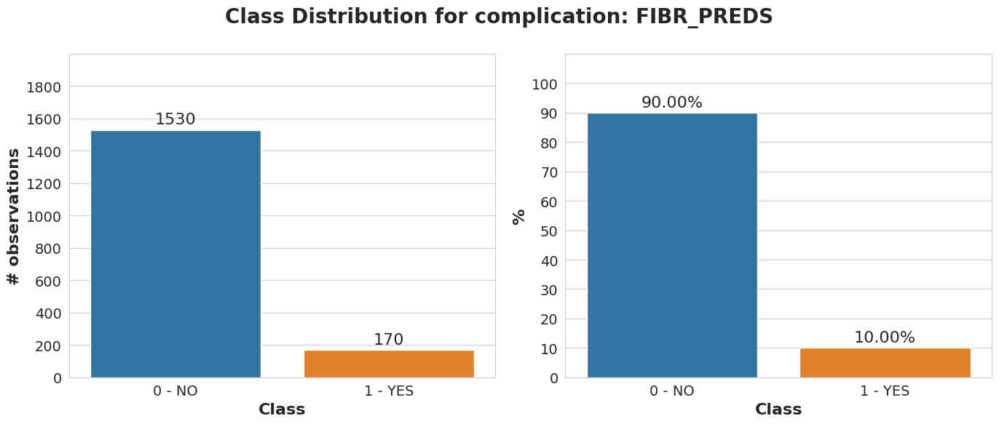

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_PREDS_TAH.png


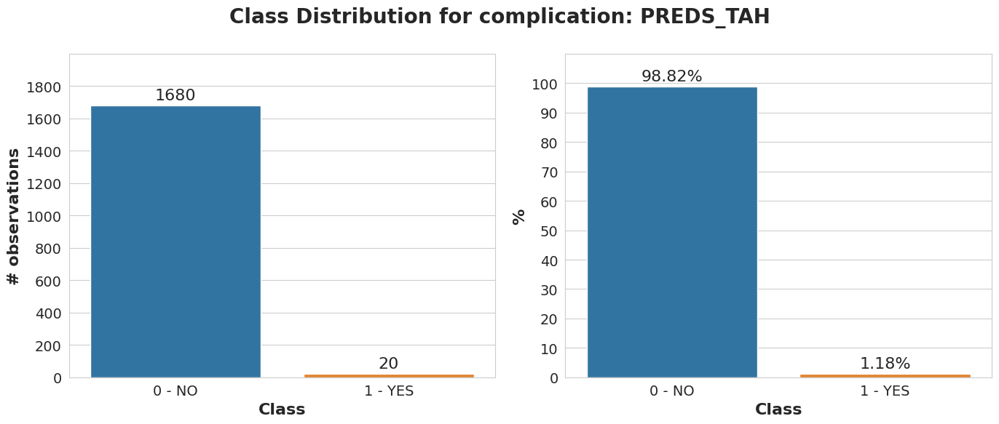

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_JELUD_TAH.png


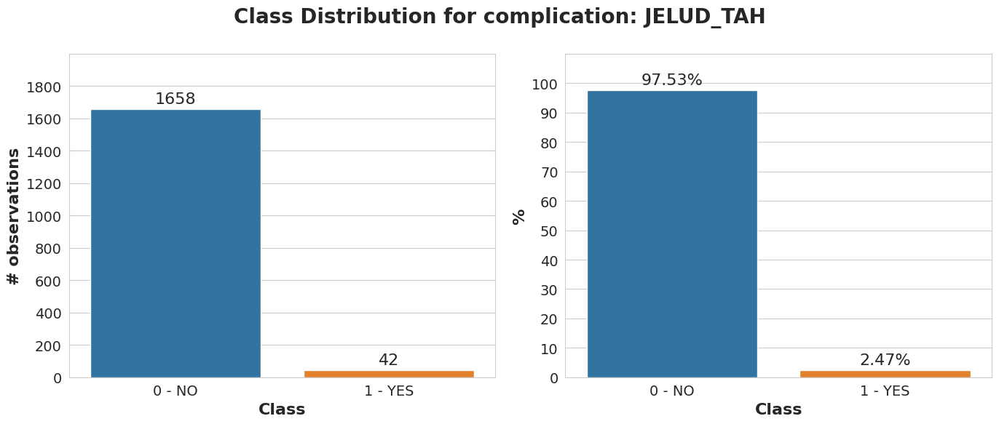

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_A_V_BLOK.png


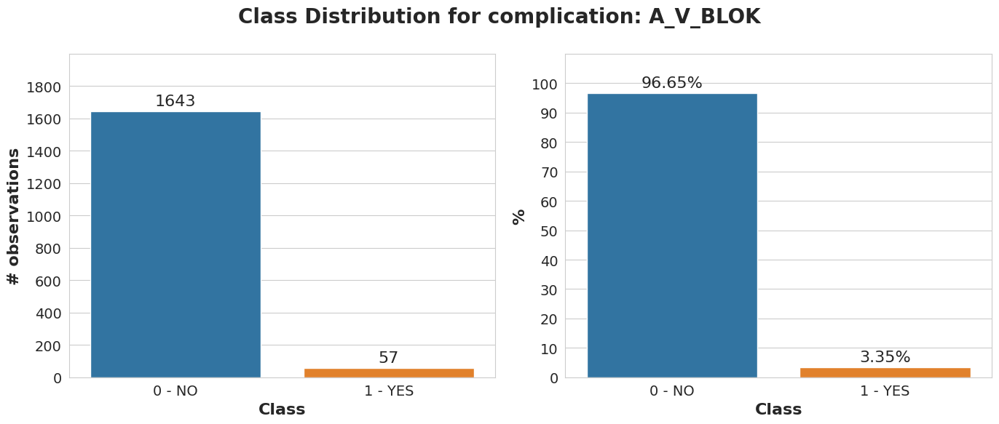

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_OTEK_LANC.png


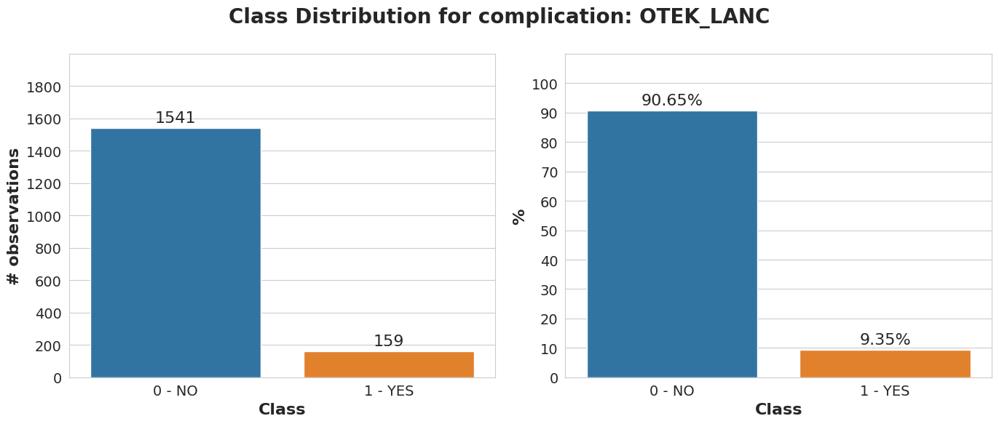

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_RAZRIV.png


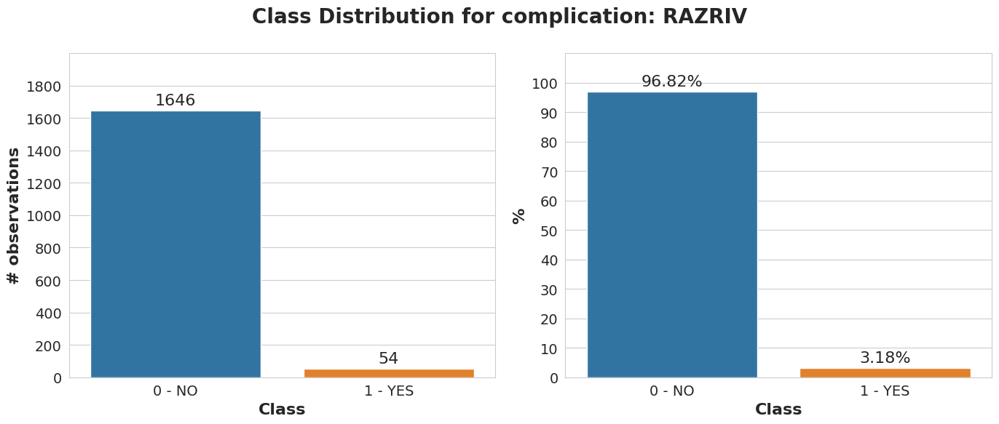

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_DRESSLER.png


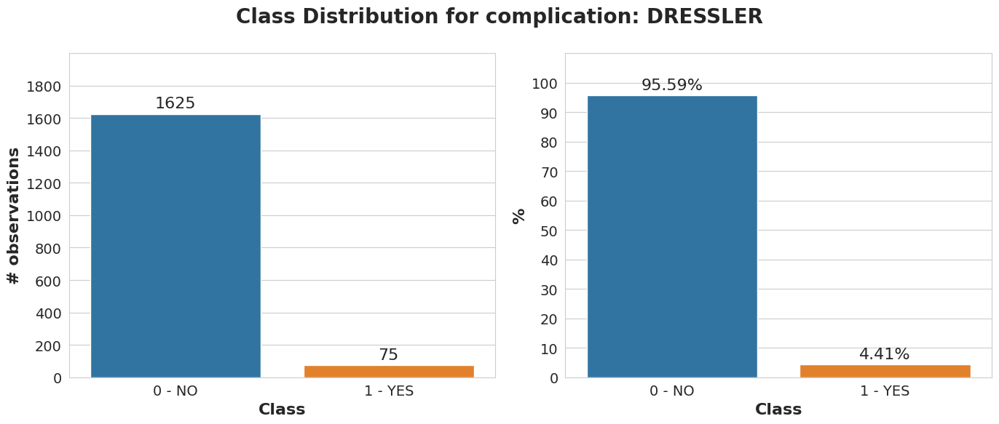

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_ZSN.png


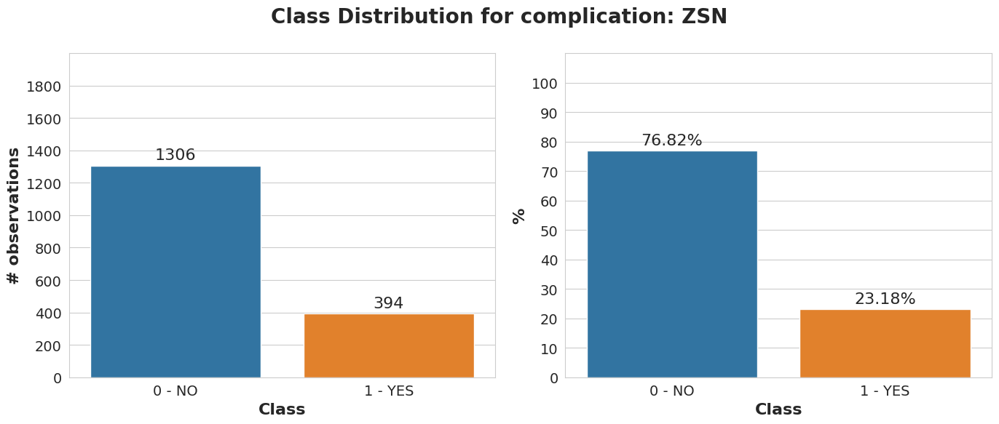

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_REC_IM.png


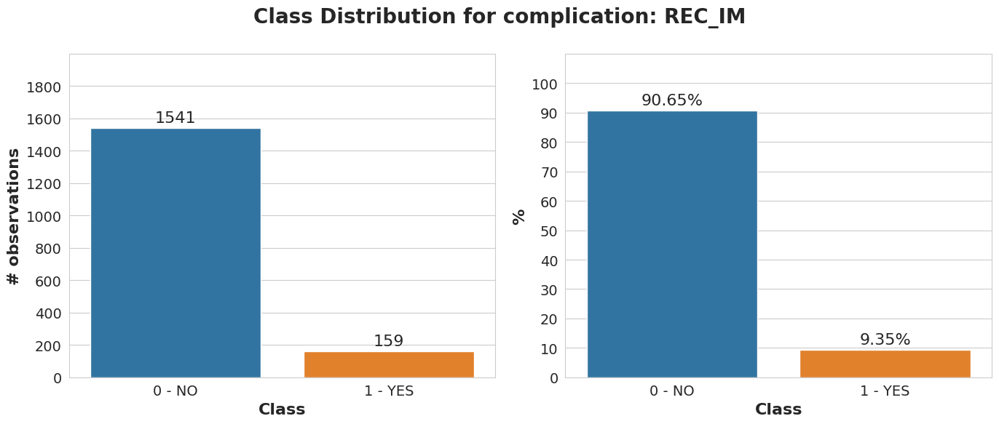

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_P_IM_STEN.png


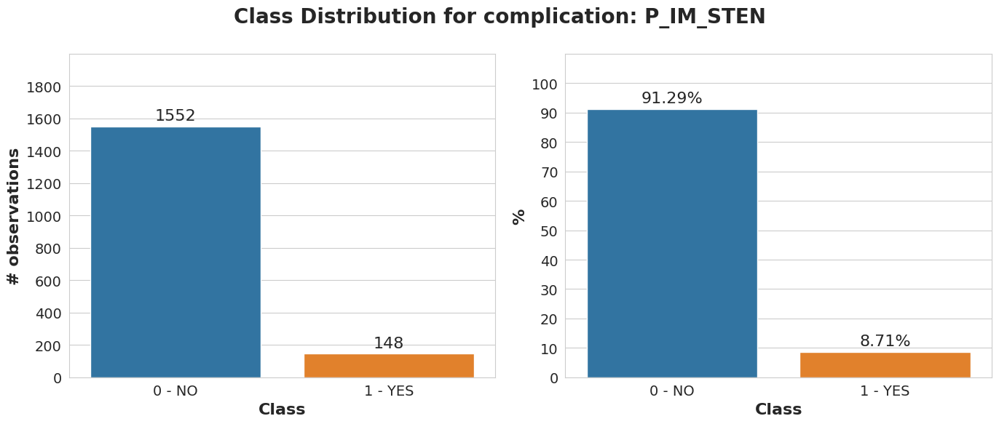

In [11]:
for target in targets:
    if target not in ["LET_IS", "LET_IS_BINARY"]:
        class_counts = df[target].value_counts().sort_index()
        total = class_counts.sum()
        class_percentages = class_counts / total * 100

        fig, axes = plt.subplots(1, 2, figsize=(14, 6))

        # ------- Subplot 1: Counting the observations per class
        sns.countplot(ax=axes[0],
                      data=df,
                      x=target,
                      hue=target,
                      legend=False)
        axes[0].set_xlabel("Class", fontweight="bold", fontsize=16)
        axes[0].set_ylabel("# observations", fontweight="bold", fontsize=16)
        axes[0].set_xticks(ticks=[0, 1], labels=["0 - NO", "1 - YES"], fontsize=14)
        axes[0].set_yticks(ticks=np.arange(0, 2000, 200),
                           labels=np.arange(0, 2000, 200),
                           fontsize=14)
        axes[0].set_ylim(0, 2000)

        for container in axes[0].containers:
            axes[0].bar_label(container, fmt="%.0f", padding=3)

        axes[0].margins(y=0.1) # Avoid clipping labels at the top

        # ------- Subplot 2: Percentage per class
        sns.barplot(ax=axes[1],
                    x=class_percentages.index.astype(str),
                    y=class_percentages.values,
                    hue=class_percentages.index.astype(str))
        axes[1].set_xlabel("Class", fontweight="bold", fontsize=16)
        axes[1].set_ylabel("%", fontweight="bold", fontsize=16)
        axes[1].set_xticks(ticks=[0, 1], labels=["0 - NO", "1 - YES"], fontsize=14)
        axes[1].set_yticks(ticks=np.arange(0, 110, 10),
                           labels=np.arange(0, 110, 10),
                           fontsize=14)
        axes[1].set_ylim(0, 110)

        for container in axes[1].containers:
            axes[1].bar_label(container, fmt="%.2f%%", padding=3)

        axes[1].margins(y=0.1)

        # ------- General settings
        plt.suptitle(f"Class Distribution for complication: {target}", fontsize=20, fontweight="bold")
        plt.tight_layout()

        class_distribution_path: Path = FIGURES_DATA_EXPLORATION_DIR / f"class_distribution_absolute_vs_percentage_{target}.png"
        plt.savefig(class_distribution_path, dpi=300)
        print(f"[SAVED] {class_distribution_path}")

        plt.show()

Plot the samples distribution with respect to the `LET_IS` target:
- `0=ALIVE`
- `1=CARDIOGENIC SHOCK`
- `2=PULMONARY EDEMA`
- `3=MYOCARDIAL RUPTURE`
- `4=CONGESTIVE HEART FAILURE`
- `5=THROMBOEMBOLISM`
- `6=ASYSTOLE`
- `7=VENTRICULAR FIBRILLATION`.

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_LET_IS.png


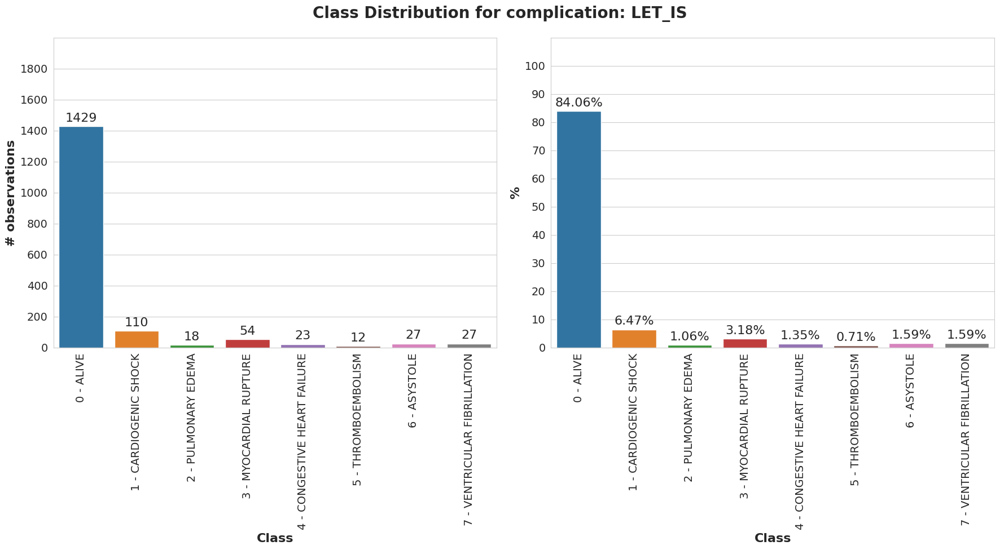

In [12]:
class_counts = df["LET_IS"].value_counts().sort_index()
total = class_counts.sum()
class_percentages = class_counts / total * 100

fig, axes = plt.subplots(1, 2, figsize=(18, 10))

# ------- Subplot 1: Counting the observations per class
sns.countplot(ax=axes[0],
              data=df,
              x="LET_IS",
              hue="LET_IS",
              legend=False)
axes[0].set_xlabel("Class", fontweight="bold", fontsize=16)
axes[0].set_ylabel("# observations", fontweight="bold", fontsize=16)
axes[0].set_xticks(ticks=[0, 1, 2, 3, 4, 5, 6, 7],
                   labels=["0 - ALIVE",
                           "1 - CARDIOGENIC SHOCK",
                           "2 - PULMONARY EDEMA",
                           "3 - MYOCARDIAL RUPTURE",
                           "4 - CONGESTIVE HEART FAILURE",
                           "5 - THROMBOEMBOLISM",
                           "6 - ASYSTOLE",
                           "7 - VENTRICULAR FIBRILLATION"],
                   fontsize=14,
                   rotation=90)
axes[0].set_yticks(ticks=np.arange(0, 2000, 200),
                   labels=np.arange(0, 2000, 200),
                   fontsize=14)
axes[0].set_ylim(0, 2000)

for container in axes[0].containers:
    axes[0].bar_label(container, fmt="%.0f", padding=3)

axes[0].margins(y=0.1) # Avoid clipping labels at the top

# ------- Subplot 2: Percentage per class
sns.barplot(ax=axes[1],
            x=class_percentages.index.astype(str),
            y=class_percentages.values,
            hue=class_percentages.index.astype(str))
axes[1].set_xlabel("Class", fontweight="bold", fontsize=16)
axes[1].set_ylabel("%", fontweight="bold", fontsize=16)
axes[1].set_xticks(ticks=[0, 1, 2, 3, 4, 5, 6, 7],
                   labels=["0 - ALIVE",
                           "1 - CARDIOGENIC SHOCK",
                           "2 - PULMONARY EDEMA",
                           "3 - MYOCARDIAL RUPTURE",
                           "4 - CONGESTIVE HEART FAILURE",
                           "5 - THROMBOEMBOLISM",
                           "6 - ASYSTOLE",
                           "7 - VENTRICULAR FIBRILLATION"],
                   fontsize=14,
                   rotation=90)
axes[1].set_yticks(ticks=np.arange(0, 110, 10),
                   labels=np.arange(0, 110, 10),
                   fontsize=14)
axes[1].set_ylim(0, 110)

for container in axes[1].containers:
    axes[1].bar_label(container, fmt="%.2f%%", padding=3)

axes[1].margins(y=0.1)

# ------- General settings
plt.suptitle(f"Class Distribution for complication: LET_IS", fontsize=20, fontweight="bold")
plt.tight_layout()

class_distribution_path: Path = FIGURES_DATA_EXPLORATION_DIR / "class_distribution_absolute_vs_percentage_LET_IS.png"
plt.savefig(class_distribution_path, dpi=300)
print(f"[SAVED] {class_distribution_path}")

plt.show()

Plot the samples distribution with respect to the `LET_IS_BINARY` target:
- `0=ALIVE`
- `1=DEAD`

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_LET_IS_BINARY.png


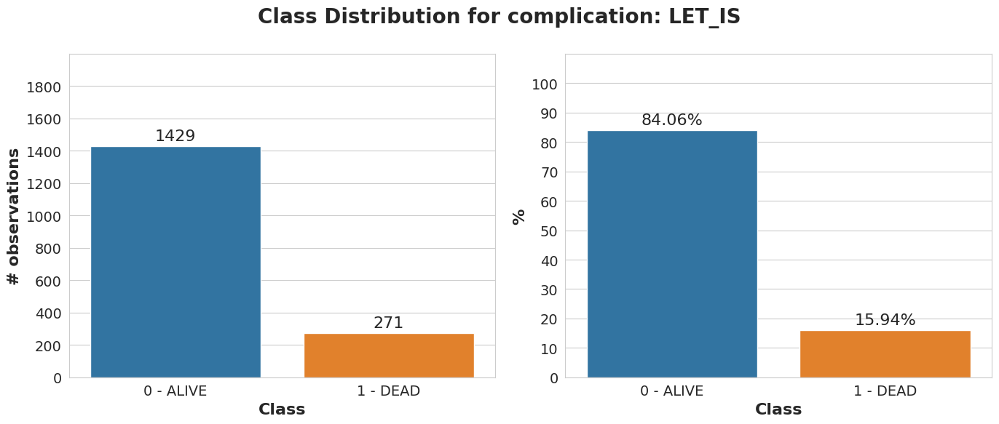

In [13]:
class_counts = df["LET_IS_BINARY"].value_counts().sort_index()
total = class_counts.sum()
class_percentages = class_counts / total * 100

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# ------- Subplot 1: Counting the observations per class
sns.countplot(ax=axes[0],
              data=df,
              x="LET_IS_BINARY",
              hue="LET_IS_BINARY",
              legend=False)
axes[0].set_xlabel("Class", fontweight="bold", fontsize=16)
axes[0].set_ylabel("# observations", fontweight="bold", fontsize=16)
axes[0].set_xticks(ticks=[0, 1], labels=["0 - ALIVE", "1 - DEAD"], fontsize=14)
axes[0].set_yticks(ticks=np.arange(0, 2000, 200),
                   labels=np.arange(0, 2000, 200),
                   fontsize=14)
axes[0].set_ylim(0, 2000)

for container in axes[0].containers:
    axes[0].bar_label(container, fmt="%.0f", padding=3)

axes[0].margins(y=0.1) # Avoid clipping labels at the top

# ------- Subplot 2: Percentage per class
sns.barplot(ax=axes[1],
            x=class_percentages.index.astype(str),
            y=class_percentages.values,
            hue=class_percentages.index.astype(str))
axes[1].set_xlabel("Class", fontweight="bold", fontsize=16)
axes[1].set_ylabel("%", fontweight="bold", fontsize=16)
axes[1].set_xticks(ticks=[0, 1], labels=["0 - ALIVE", "1 - DEAD"], fontsize=14)
axes[1].set_yticks(ticks=np.arange(0, 110, 10),
                   labels=np.arange(0, 110, 10),
                   fontsize=14)
axes[1].set_ylim(0, 110)

for container in axes[1].containers:
    axes[1].bar_label(container, fmt="%.2f%%", padding=3)

axes[1].margins(y=0.1)

# ------- General settings
plt.suptitle(f"Class Distribution for complication: LET_IS", fontsize=20, fontweight="bold")
plt.tight_layout()

class_distribution_path: Path = FIGURES_DATA_EXPLORATION_DIR / "class_distribution_absolute_vs_percentage_LET_IS_BINARY.png"
plt.savefig(class_distribution_path, dpi=300)
print(f"[SAVED] {class_distribution_path}")

plt.show()

##  Quantitative Variables Analysis

### Quantitative Discrete Variables Analysis

In [14]:
df[INT_FEATURES].describe()

,AGE,S_AD_KBRIG,D_AD_KBRIG,S_AD_ORIT,D_AD_ORIT
count,1692.0,624.0,624.0,1433.0,1433.0
mean,61.856974,136.907051,81.394231,134.588276,82.749477
std,11.259936,34.997835,19.745045,31.348388,18.321063
min,26.0,0.0,0.0,0.0,0.0
25%,54.0,120.0,70.0,120.0,80.0
50%,63.0,140.0,80.0,130.0,80.0
75%,70.0,160.0,90.0,150.0,90.0
max,92.0,260.0,190.0,260.0,190.0


In [15]:
df[INT_FEATURES].skew()

AGE          -0.219756
S_AD_KBRIG    0.090465
D_AD_KBRIG   -0.745823
S_AD_ORIT    -0.283034
D_AD_ORIT    -1.028342
dtype: Float64

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/hist_kde_AGE.png


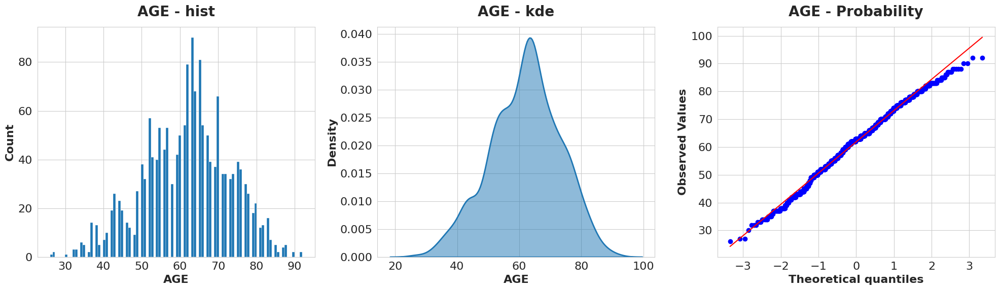

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/hist_kde_S_AD_KBRIG.png


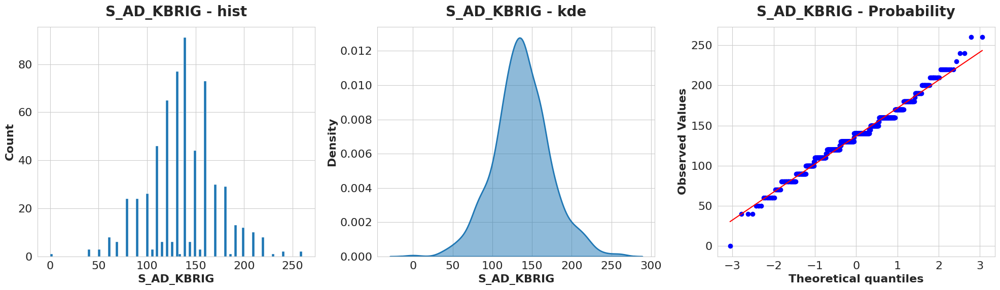

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/hist_kde_D_AD_KBRIG.png


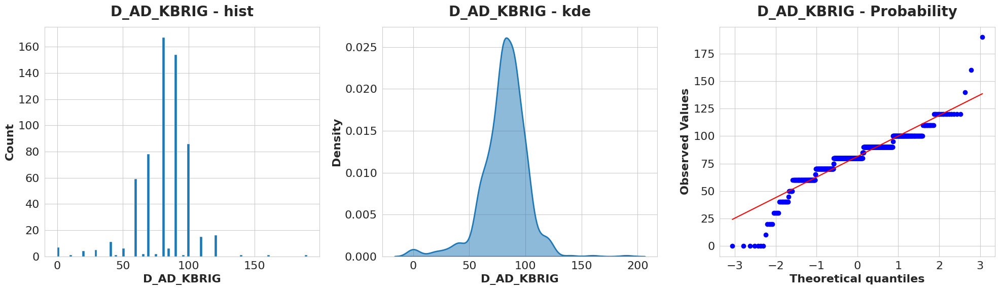

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/hist_kde_S_AD_ORIT.png


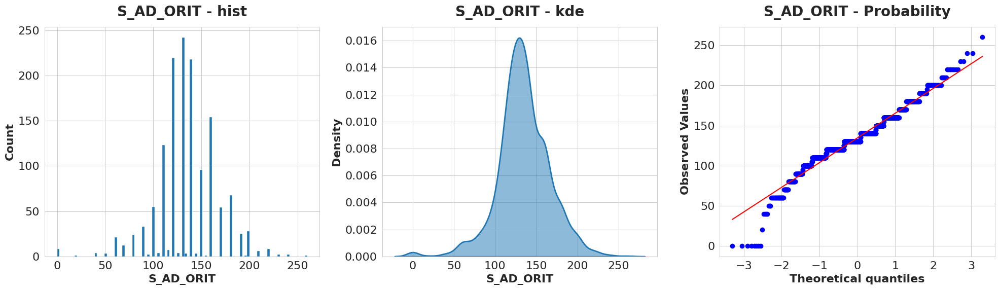

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/hist_kde_D_AD_ORIT.png


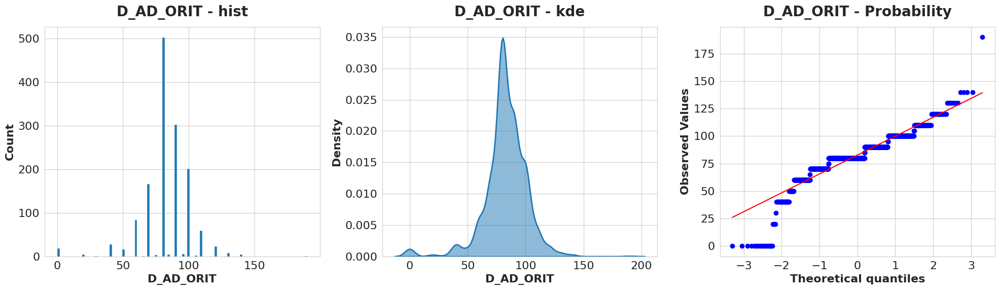

In [16]:
for num_variable in INT_FEATURES:
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))

    sns.histplot(ax=axes[0],
                 data=df,
                 x=num_variable,
                 bins=100,
                 stat="count",
                 kde=False,
                 color=sns.color_palette()[0],
                 alpha=1.0,
                 fill=True,)
    axes[0].set_xlabel(num_variable, fontweight="bold", fontsize=16)
    axes[0].set_ylabel("Count", fontweight="bold", fontsize=16)
    axes[0].set_title(f"{num_variable} - hist", fontsize=20, fontweight="bold", pad=15)

    sns.kdeplot(ax=axes[1],
                data=df,
                x=num_variable,
                fill=True,
                common_norm=False,
                alpha=0.5,
                linewidth=2.0,)
    axes[1].set_xlabel(num_variable, fontweight="bold", fontsize=16)
    axes[1].set_ylabel("Density", fontweight="bold", fontsize=16)
    axes[1].set_title(f"{num_variable} - kde", fontsize=20, fontweight="bold", pad=15)

    stats.probplot(plot=axes[2],
                   x=df[num_variable].replace([np.inf, -np.inf], np.nan).dropna().to_numpy(),
                   dist="norm",)
    axes[2].set_xlabel("Theoretical quantiles", fontweight="bold", fontsize=16)
    axes[2].set_ylabel("Observed Values", fontweight="bold", fontsize=16)
    axes[2].set_title(f"{num_variable} - Probability", fontsize=20, fontweight="bold", pad=15)

    # ------- General settings
    plt.tight_layout()

    int_features_hist_path: Path = FIGURES_DATA_EXPLORATION_DIR / f"hist_kde_{num_variable}.png"
    plt.savefig(int_features_hist_path, dpi=300)
    print(f"[SAVED] {int_features_hist_path}")

    plt.show()

### Quantitative Continuous Variables Analysis


In [17]:
df[FLOAT_FEATURES].describe()

,K_BLOOD,NA_BLOOD,ALT_BLOOD,AST_BLOOD,KFK_BLOOD,L_BLOOD,ROE
count,1329.000000,1325.000000,1416.000000,1415.000000,4.000000,1575.000000,1497.000000
mean,4.191422,136.550943,0.481455,0.263717,2.000000,8.782914,13.444890
std,0.754076,6.512120,0.387261,0.201802,1.095445,3.400557,11.296316
min,2.300000,117.000000,0.030000,0.040000,1.200000,2.000000,1.000000
25%,3.700000,133.000000,0.230000,0.150000,1.350000,6.400000,5.000000
50%,4.100000,136.000000,0.380000,0.220000,1.600000,8.000000,10.000000
75%,4.600000,140.000000,0.610000,0.330000,2.250000,10.450000,18.000000
max,8.200000,169.000000,3.000000,2.150000,3.600000,27.900000,140.000000


In [18]:
df[FLOAT_FEATURES].skew()

K_BLOOD      0.955688
NA_BLOOD     0.122988
ALT_BLOOD    2.269564
AST_BLOOD    2.559231
KFK_BLOOD    1.704026
L_BLOOD      1.341661
ROE          2.290275
dtype: float64

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/hist_kde_K_BLOOD.png


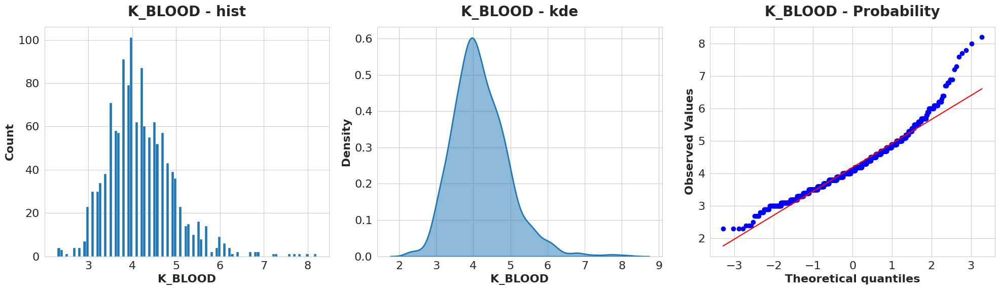

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/hist_kde_NA_BLOOD.png


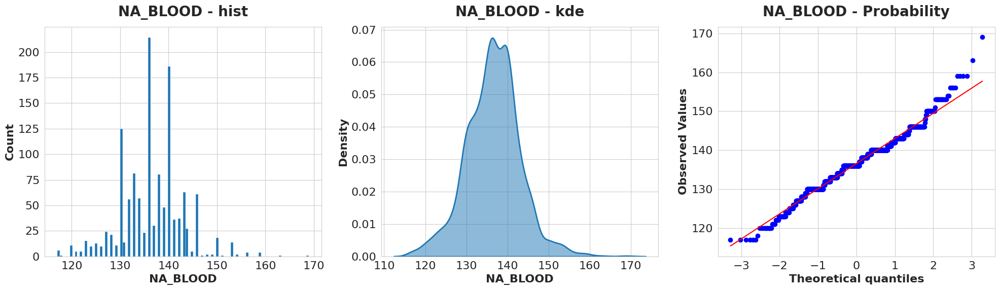

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/hist_kde_ALT_BLOOD.png


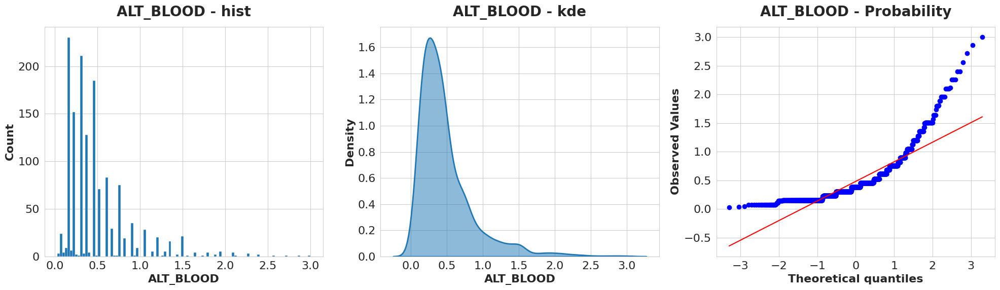

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/hist_kde_AST_BLOOD.png


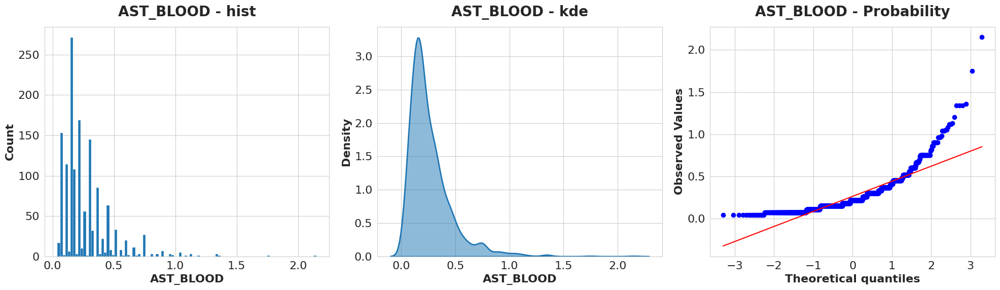

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/hist_kde_KFK_BLOOD.png


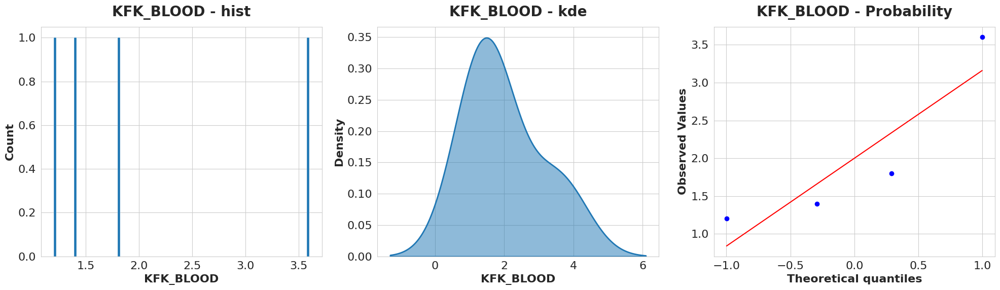

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/hist_kde_L_BLOOD.png


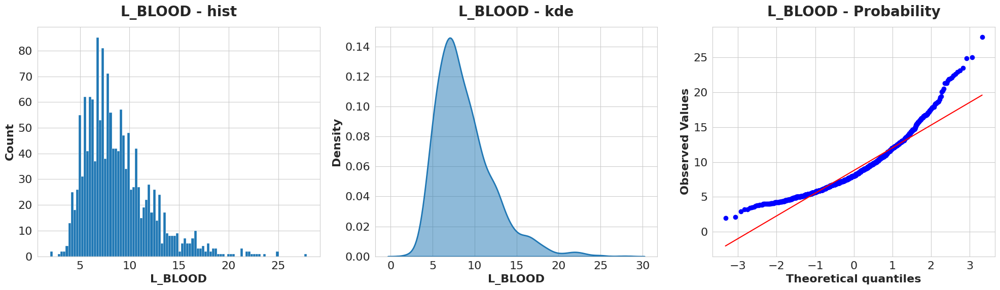

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/hist_kde_ROE.png


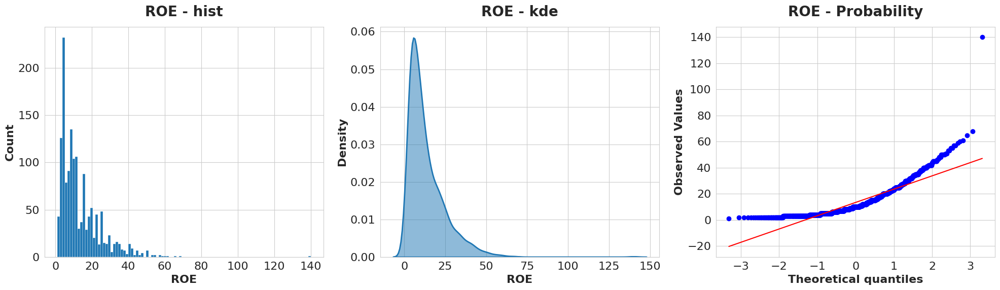

In [19]:
for num_variable in FLOAT_FEATURES:
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))

    sns.histplot(ax=axes[0],
                 data=df,
                 x=num_variable,
                 bins=100,
                 stat="count",
                 kde=False,
                 color=sns.color_palette()[0],
                 alpha=1.0,
                 fill=True,)
    axes[0].set_xlabel(num_variable, fontweight="bold", fontsize=16)
    axes[0].set_ylabel("Count", fontweight="bold", fontsize=16)
    axes[0].set_title(f"{num_variable} - hist", fontsize=20, fontweight="bold", pad=15)

    sns.kdeplot(ax=axes[1],
                data=df,
                x=num_variable,
                fill=True,
                common_norm=False,
                alpha=0.5,
                linewidth=2.0,)
    axes[1].set_xlabel(num_variable, fontweight="bold", fontsize=16)
    axes[1].set_ylabel("Density", fontweight="bold", fontsize=16)
    axes[1].set_title(f"{num_variable} - kde", fontsize=20, fontweight="bold", pad=15)

    stats.probplot(plot=axes[2],
                   x=df[num_variable].replace([np.inf, -np.inf], np.nan).dropna().to_numpy(),
                   dist="norm",)
    axes[2].set_xlabel("Theoretical quantiles", fontweight="bold", fontsize=16)
    axes[2].set_ylabel("Observed Values", fontweight="bold", fontsize=16)
    axes[2].set_title(f"{num_variable} - Probability", fontsize=20, fontweight="bold", pad=15)

    # ------- General settings
    plt.tight_layout()

    int_features_hist_path: Path = FIGURES_DATA_EXPLORATION_DIR / f"hist_kde_{num_variable}.png"
    plt.savefig(int_features_hist_path, dpi=300)
    print(f"[SAVED] {int_features_hist_path}")

    plt.show()

### Correlation Matrix of Quantitative Variables

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/correlation_matrix.png


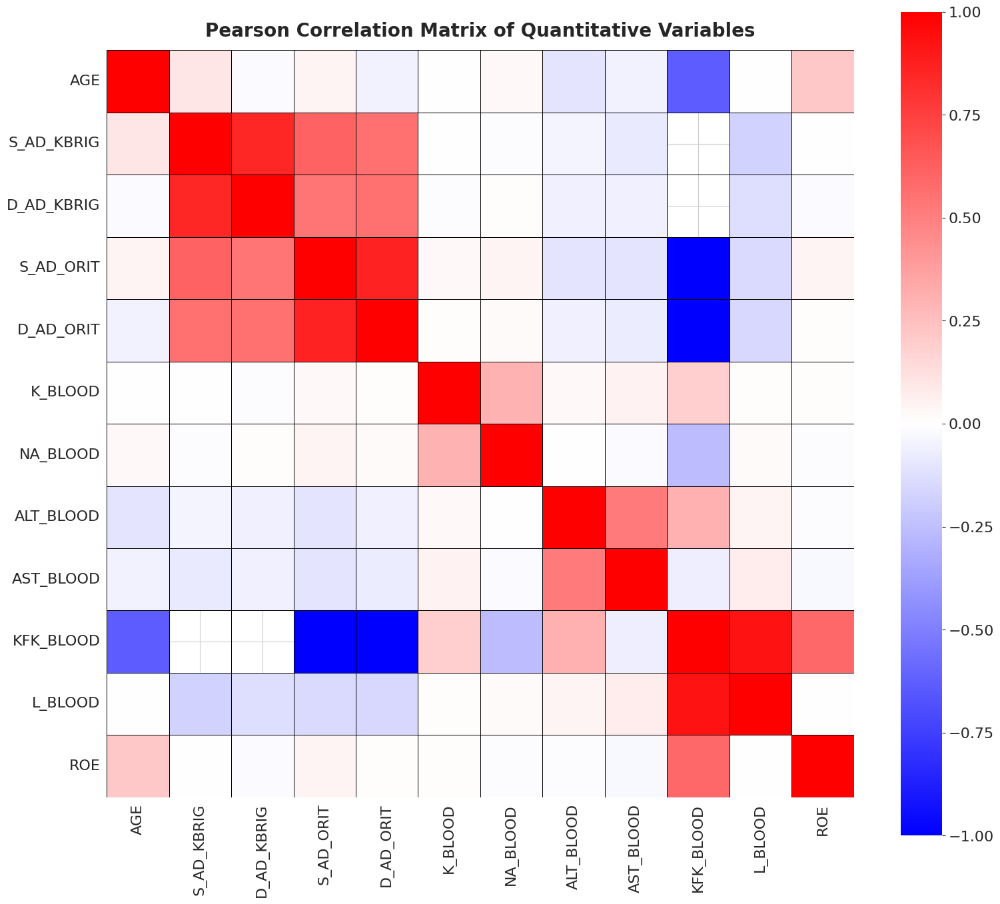

In [20]:
corr = df.loc[:, INT_FEATURES + FLOAT_FEATURES].corr()

plt.figure(figsize=(16, 14))
sns.heatmap(
    data=corr,
    cmap="bwr",
    vmin=-1,
    vmax=1,
    center=0,
    square=True,
    annot=False,
    linecolor="k",
    linewidths=0.5,
)

plt.tick_params(labelsize=16)
plt.title("Pearson Correlation Matrix of Quantitative Variables",
          fontsize=20,
          fontweight="bold",
          pad=15)

# ------- General settings
plt.tight_layout()

int_float_corr_path: Path = FIGURES_DATA_EXPLORATION_DIR / "correlation_matrix.png"
plt.savefig(int_float_corr_path, dpi=300)
print(f"[SAVED] {int_float_corr_path}")

plt.show()

## Categorical Variables Analysis

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_INF_ANAM.png


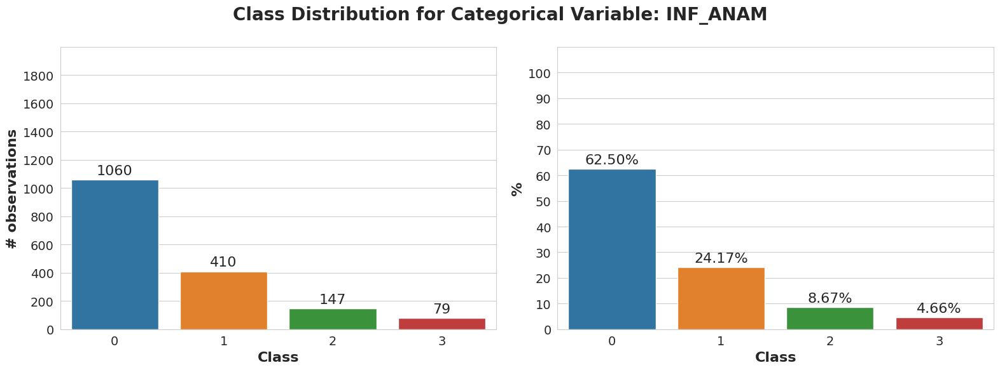

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_STENOK_AN.png


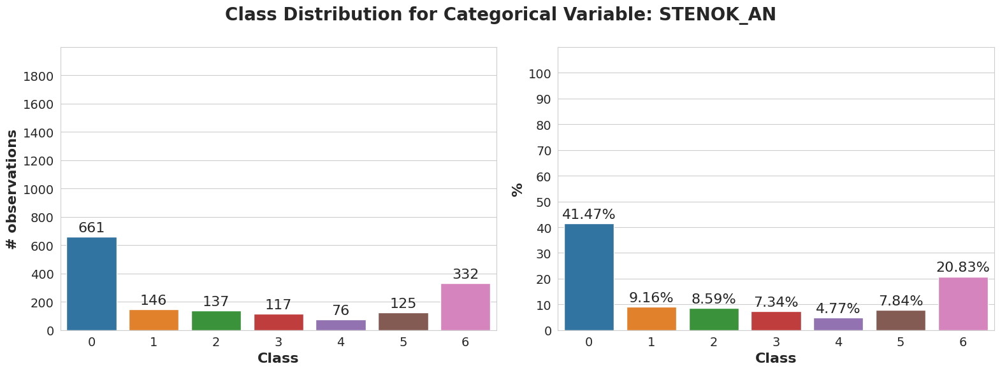

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_FK_STENOK.png


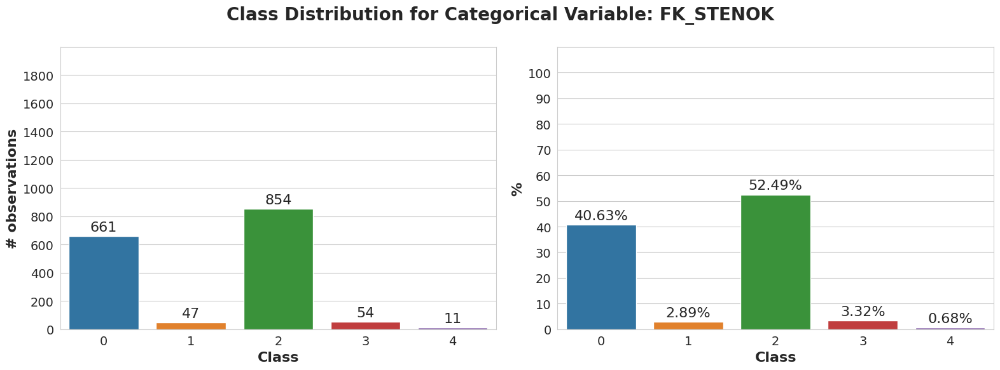

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_GB.png


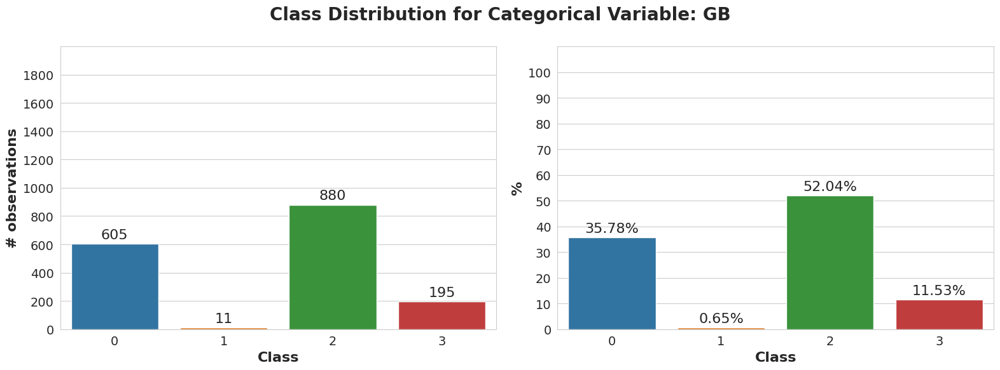

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_DLIT_AG.png


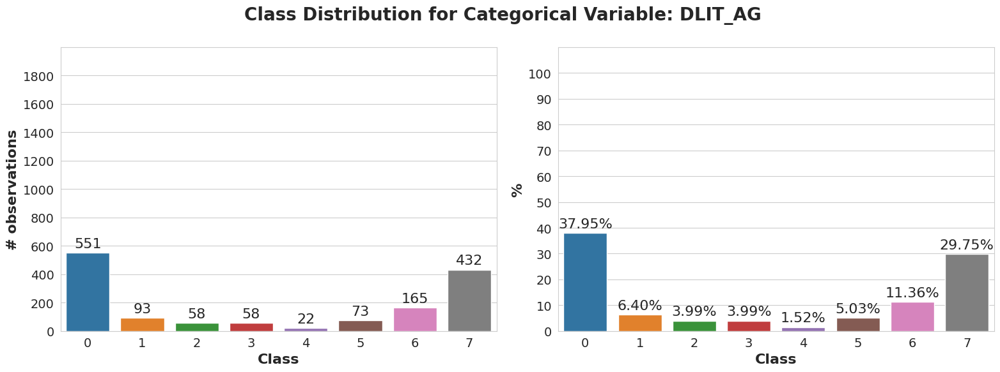

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_ZSN_A.png


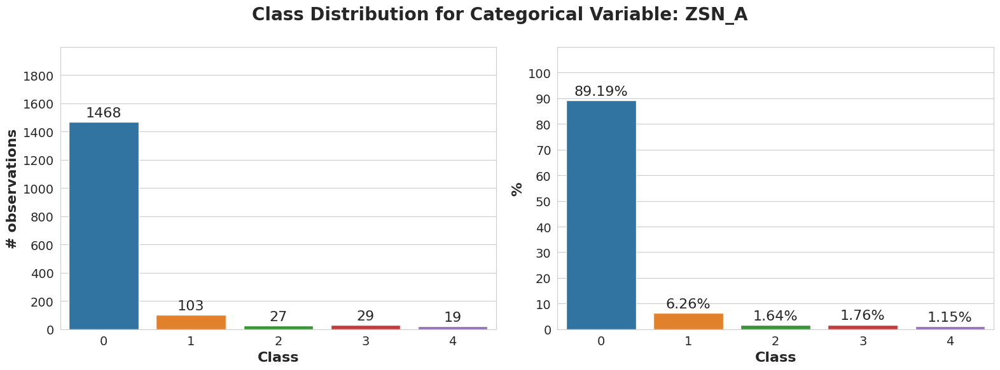

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_TIME_B_S.png


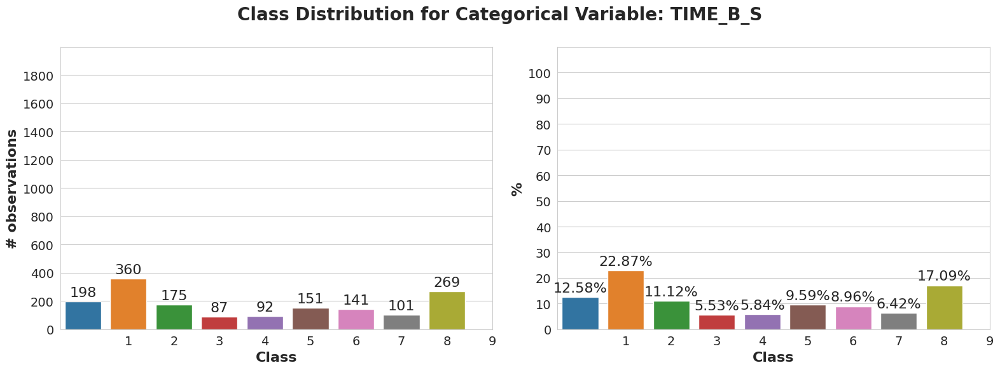

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_R_AB_1_n.png


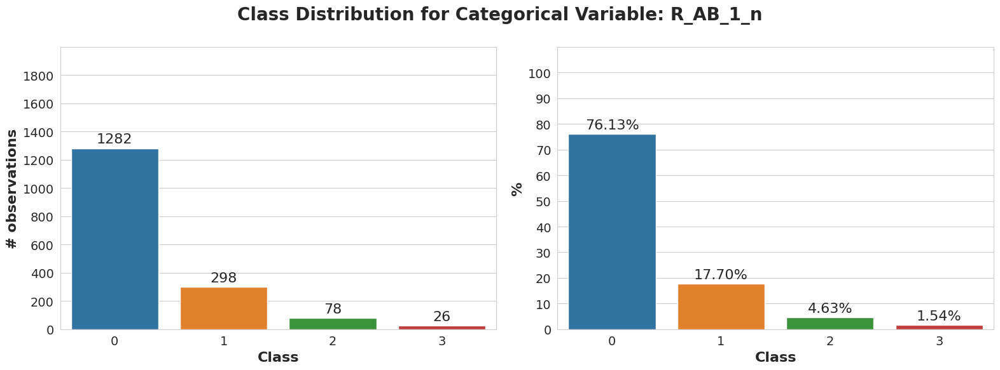

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_R_AB_2_n.png


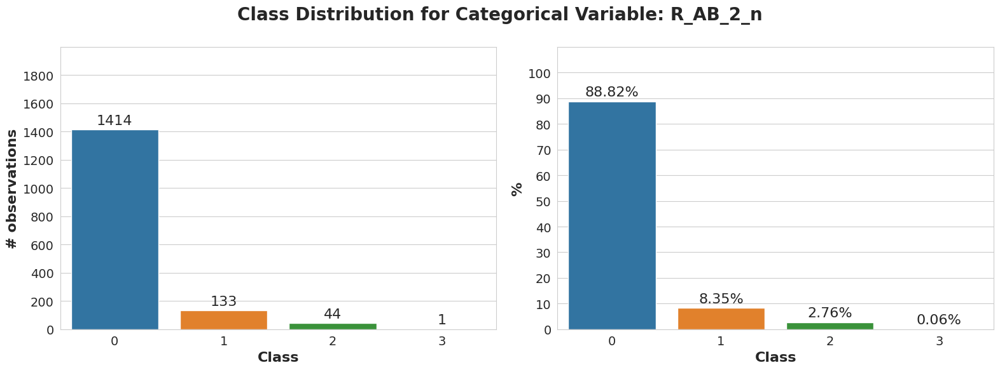

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_R_AB_3_n.png


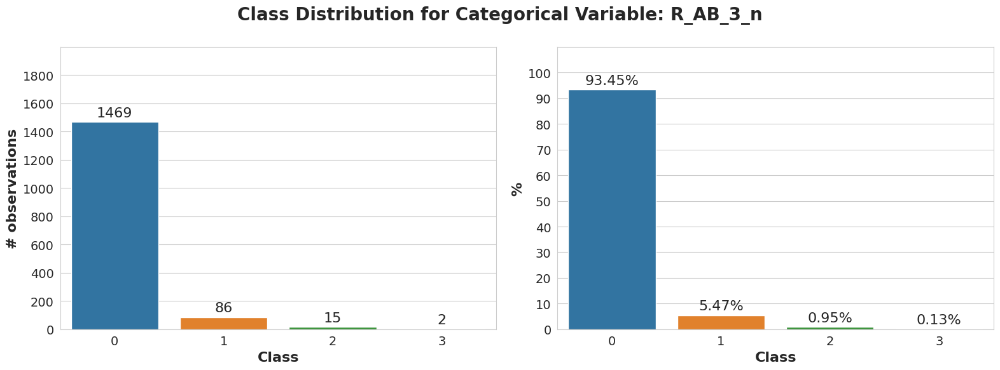

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_NA_R_1_n.png


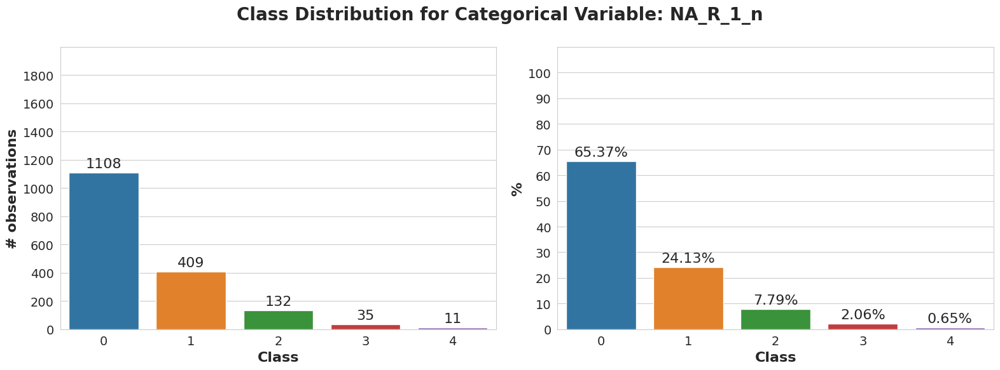

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_NA_R_2_n.png


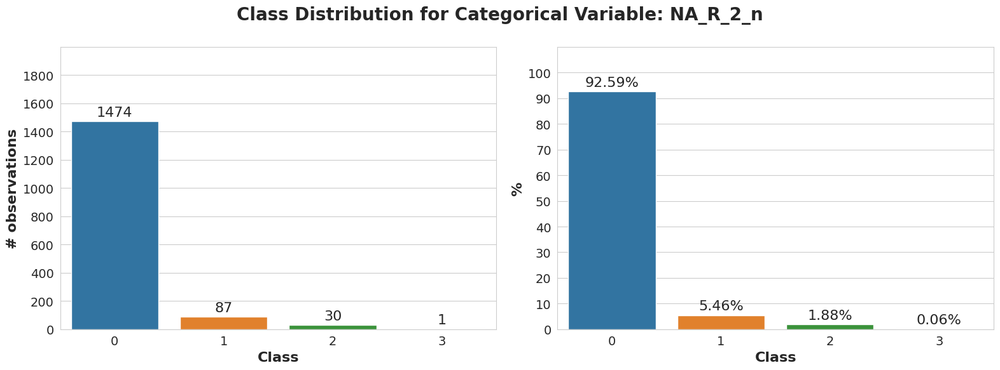

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_NA_R_3_n.png


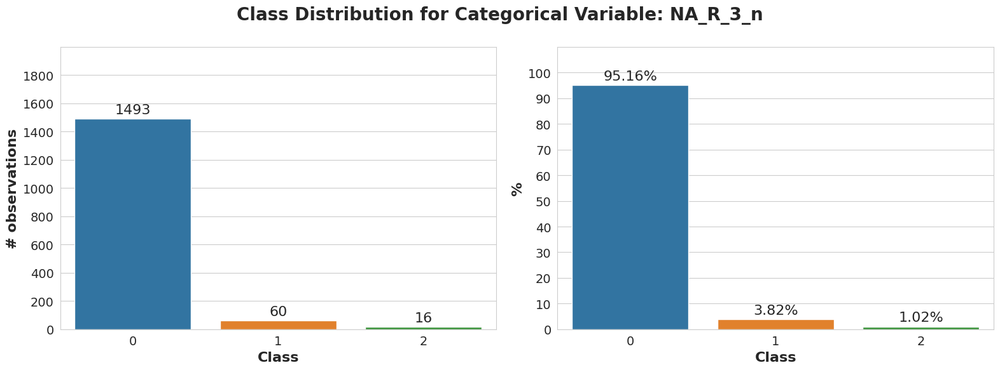

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_NOT_NA_1_n.png


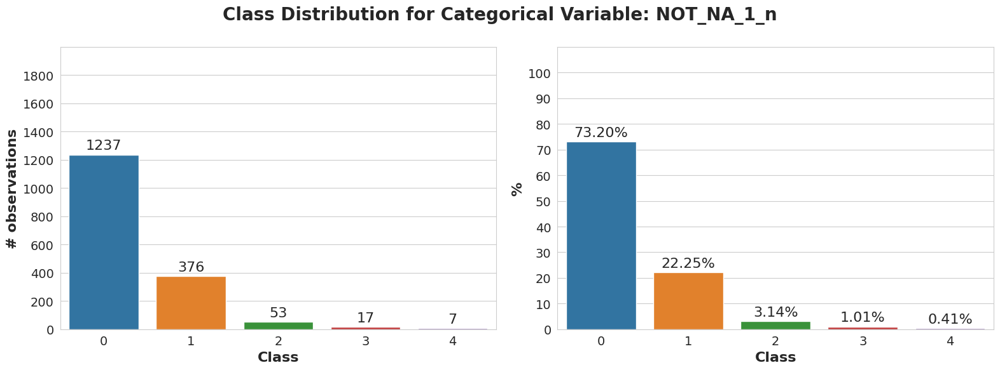

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_NOT_NA_2_n.png


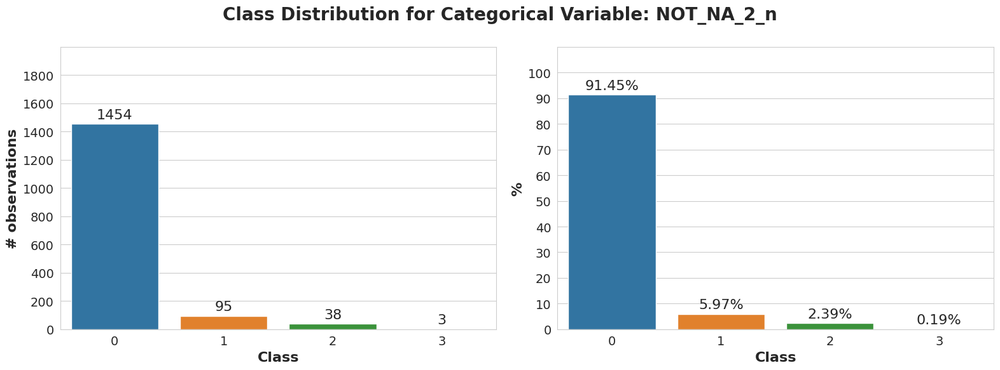

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_NOT_NA_3_n.png


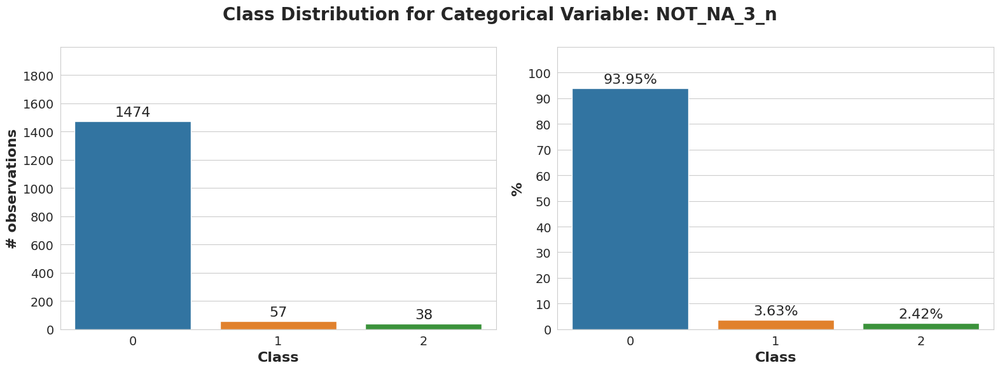

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_ant_im.png


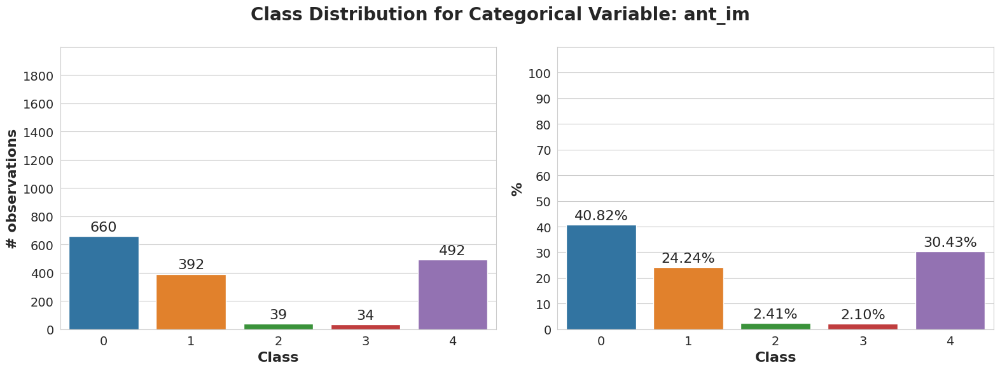

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_lat_im.png


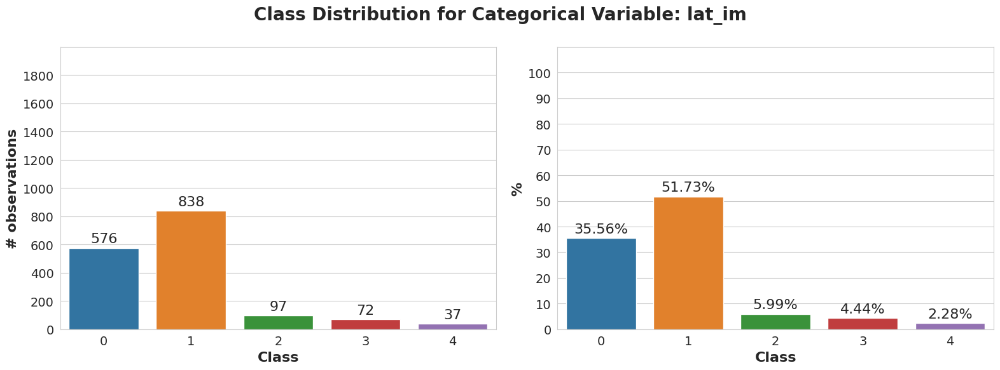

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_inf_im.png


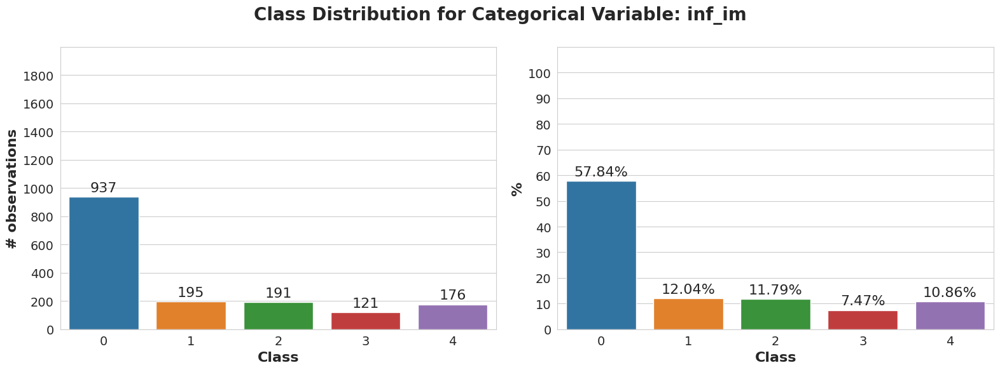

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_post_im.png


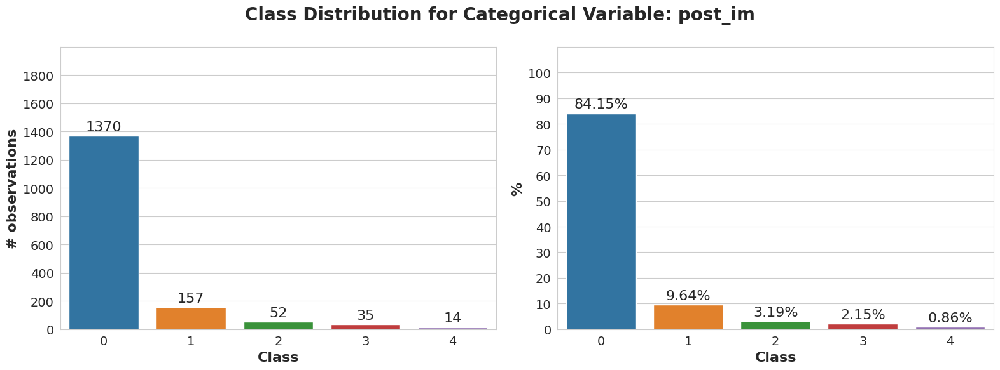

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_SEX.png


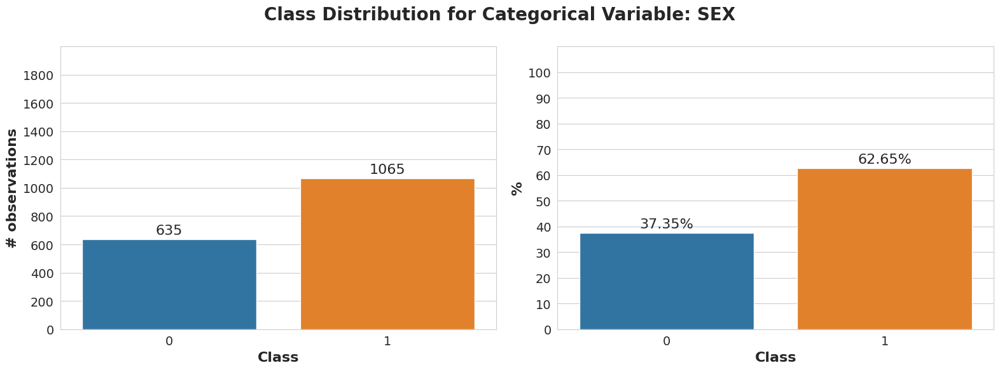

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_IBS_NASL.png


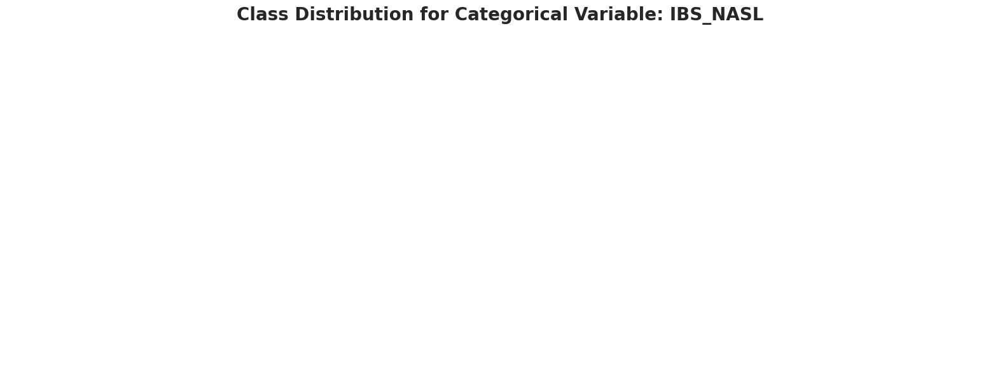

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_SIM_GIPERT.png


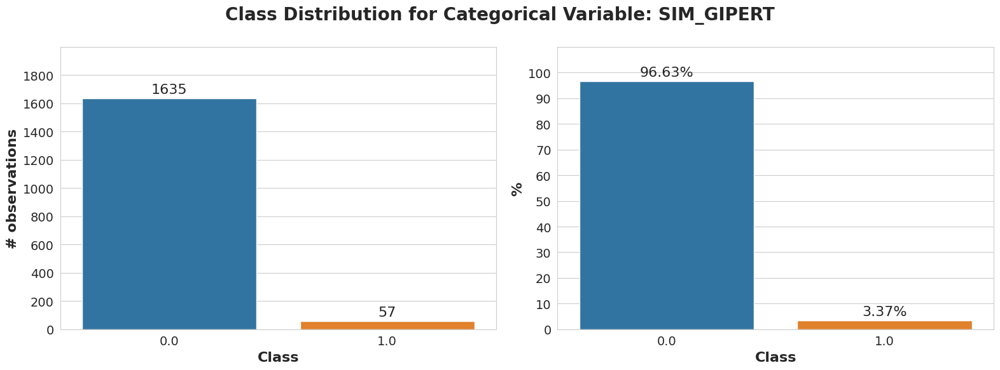

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_nr_11.png


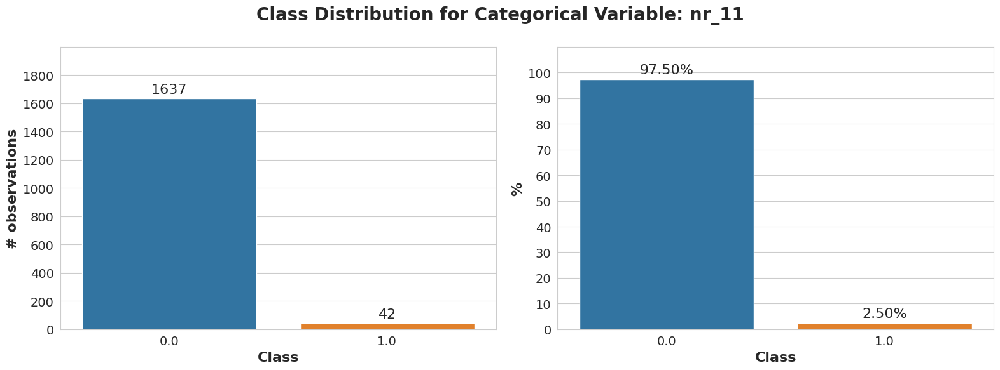

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_nr_01.png


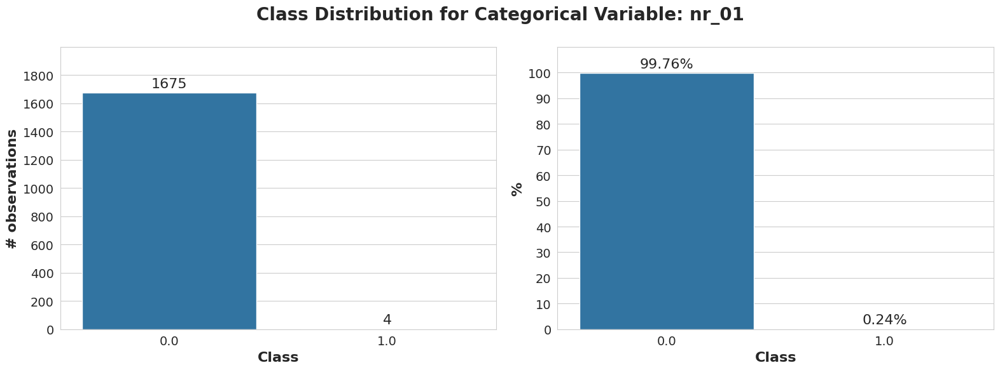

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_nr_02.png


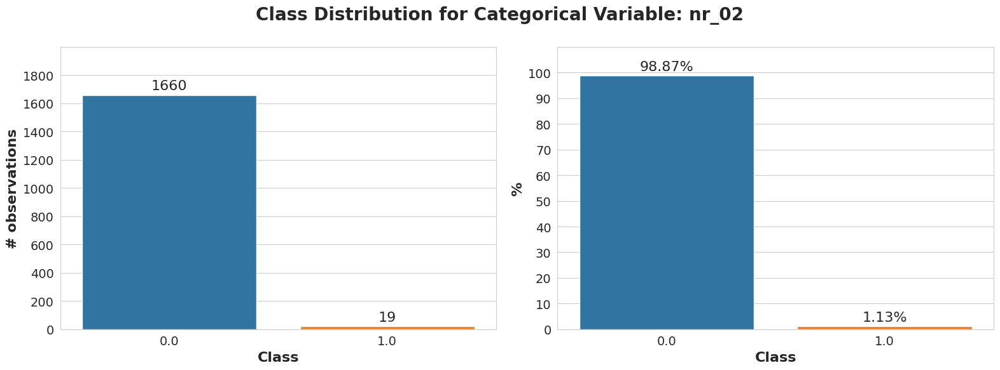

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_nr_03.png


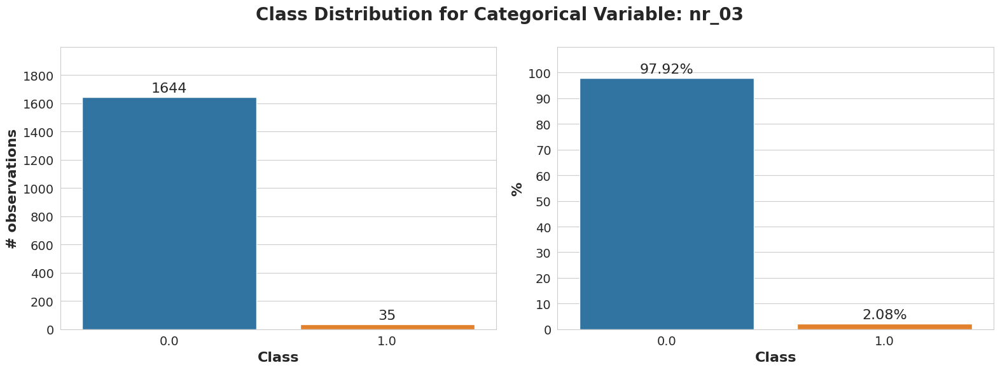

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_nr_04.png


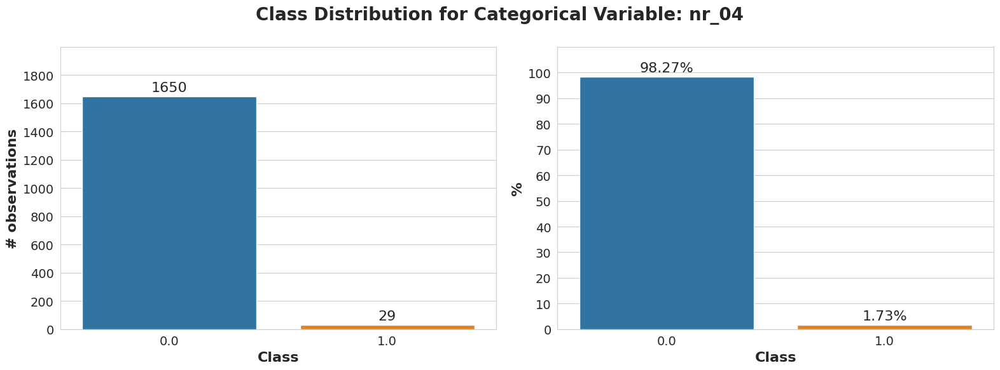

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_nr_07.png


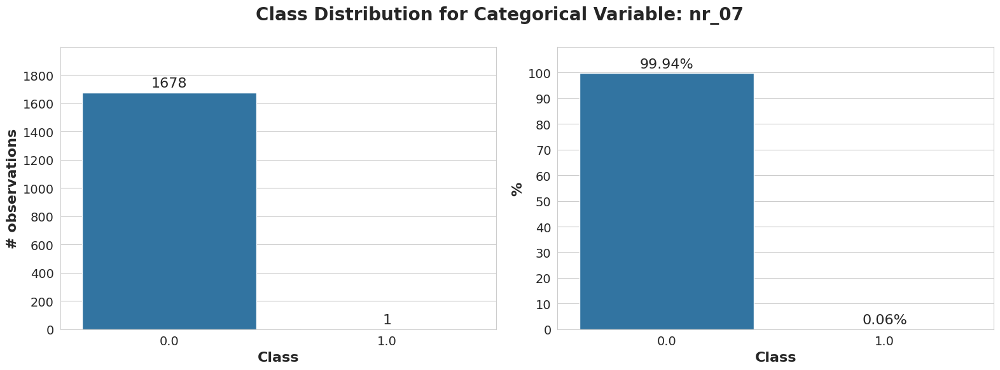

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_nr_08.png


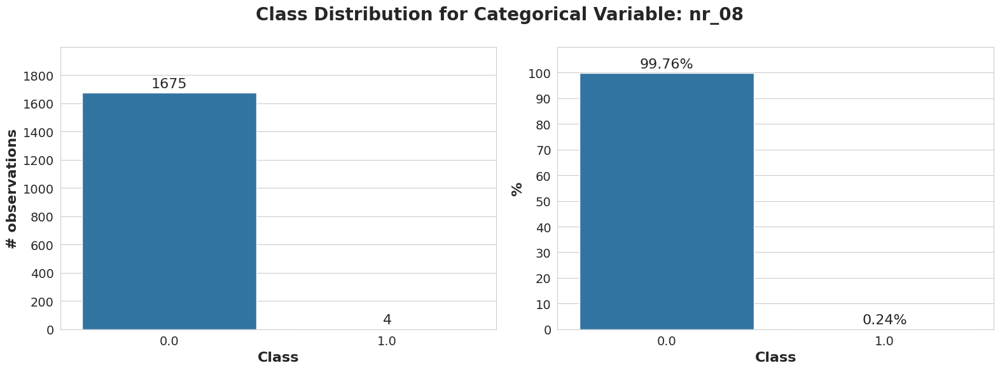

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_np_01.png


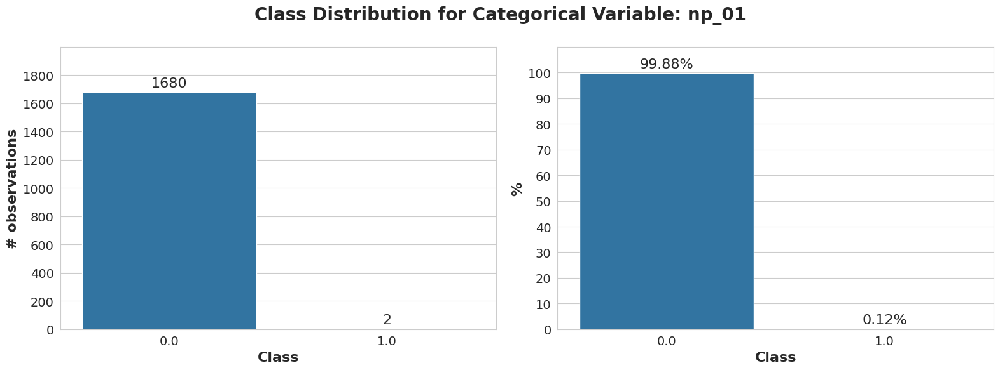

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_np_04.png


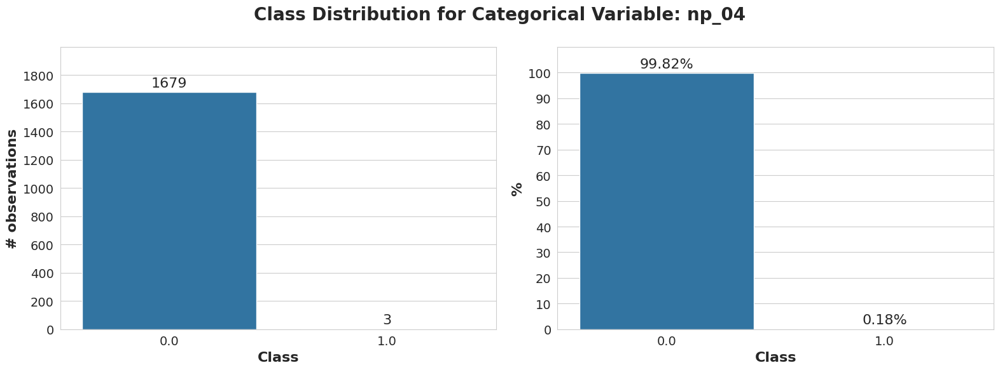

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_np_05.png


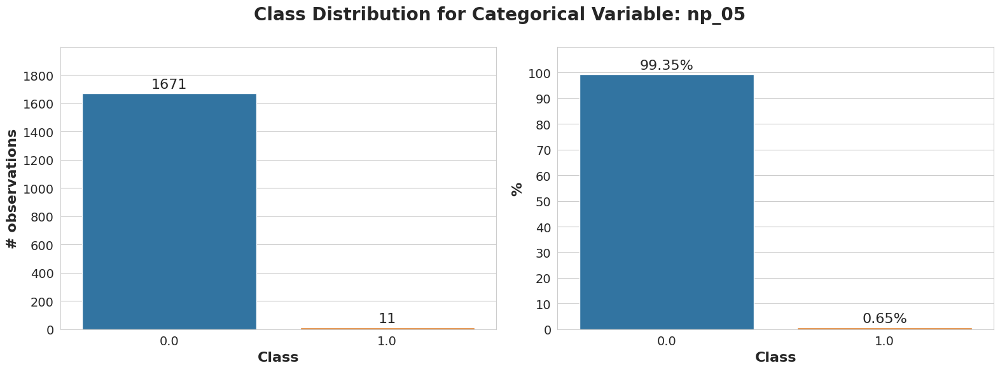

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_np_07.png


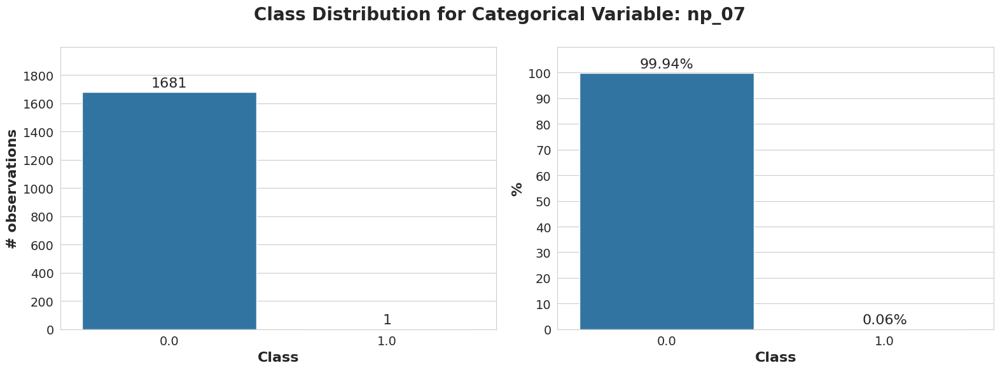

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_np_08.png


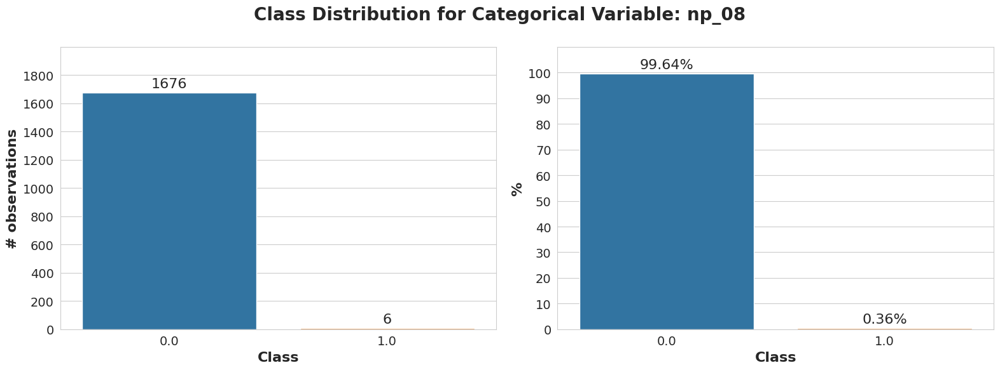

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_np_09.png


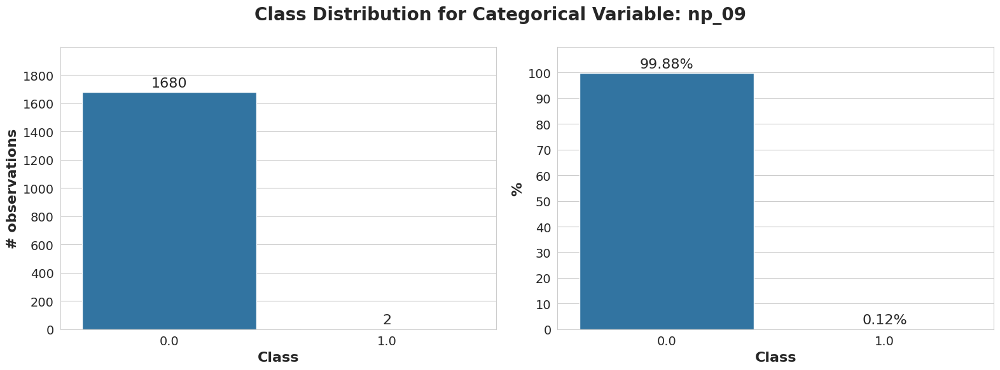

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_np_10.png


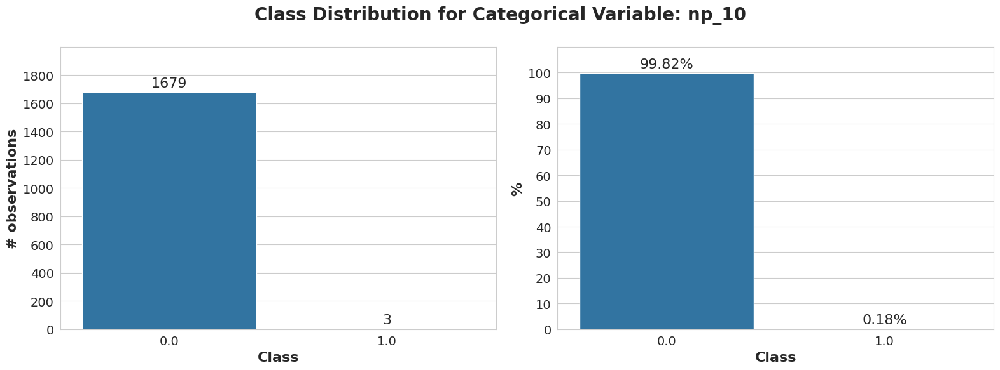

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_endocr_01.png


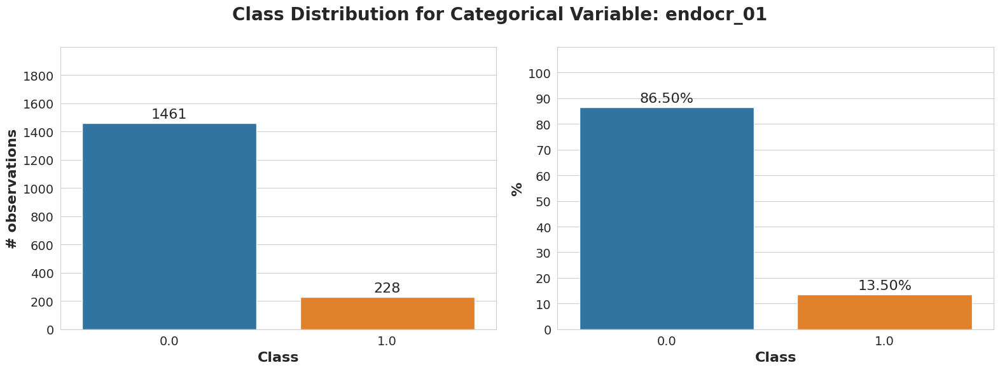

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_endocr_02.png


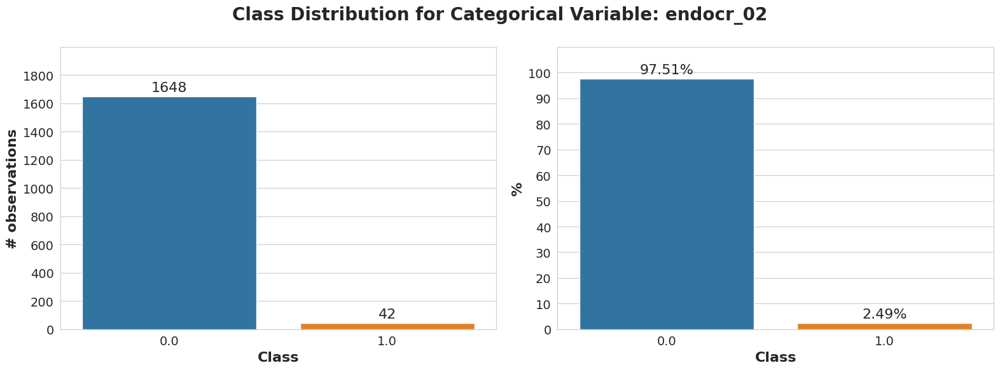

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_endocr_03.png


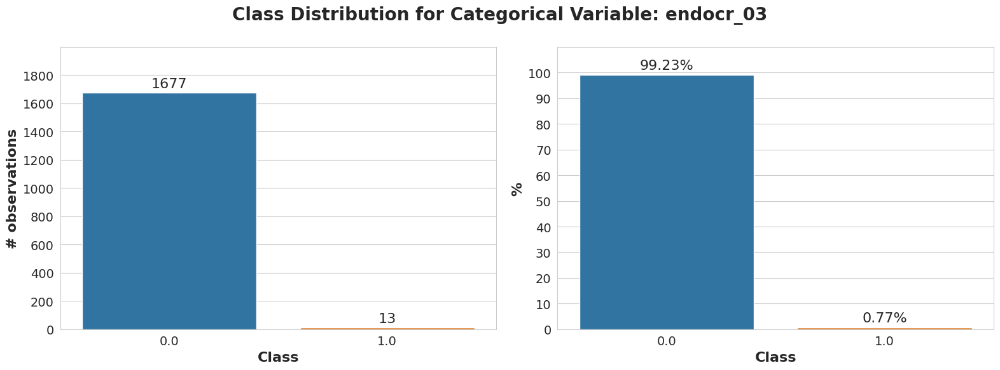

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_zab_leg_01.png


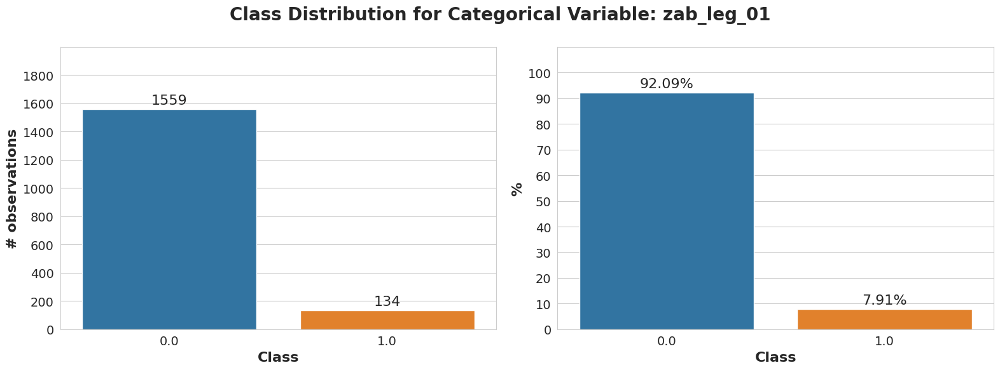

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_zab_leg_02.png


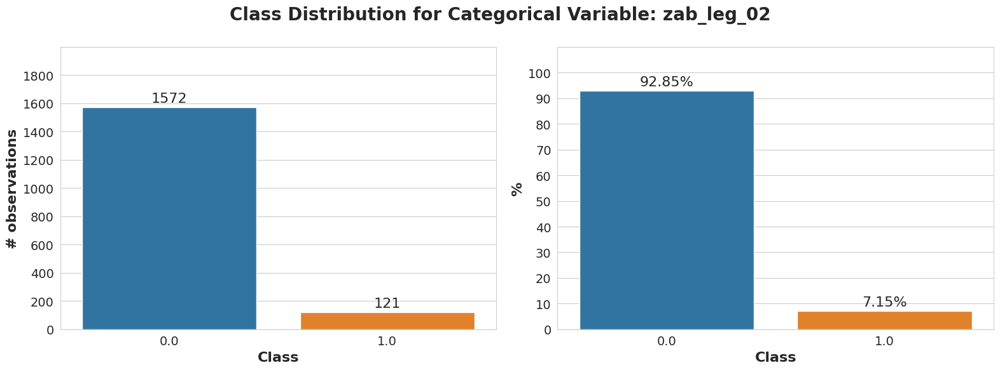

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_zab_leg_03.png


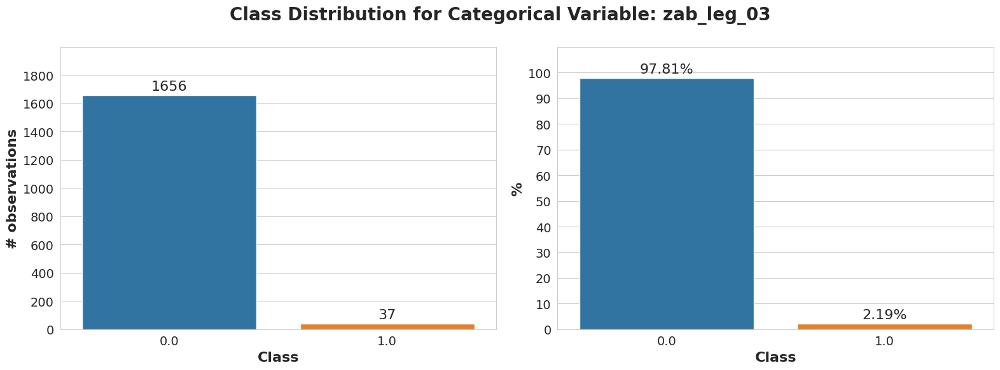

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_zab_leg_04.png


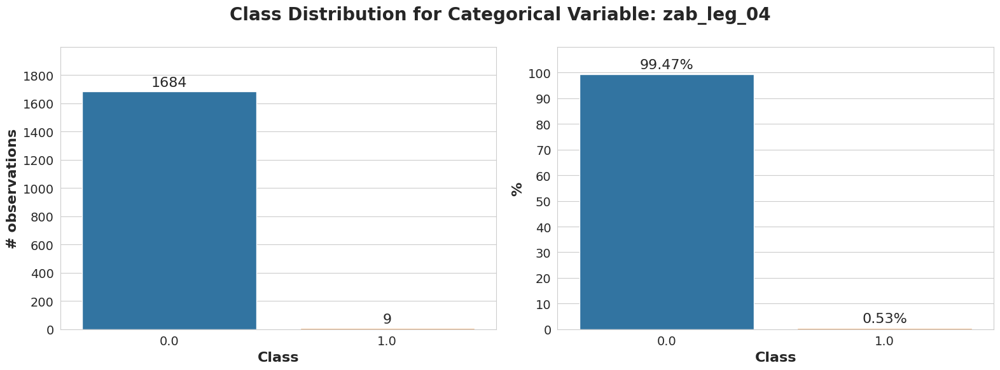

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_zab_leg_06.png


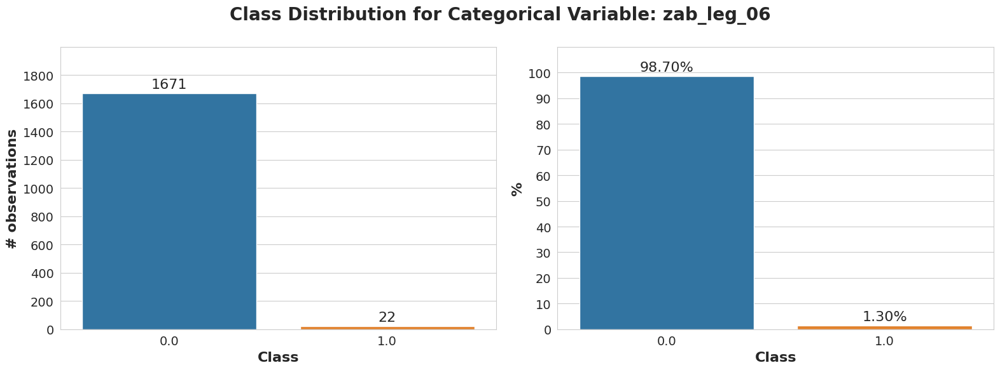

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_O_L_POST.png


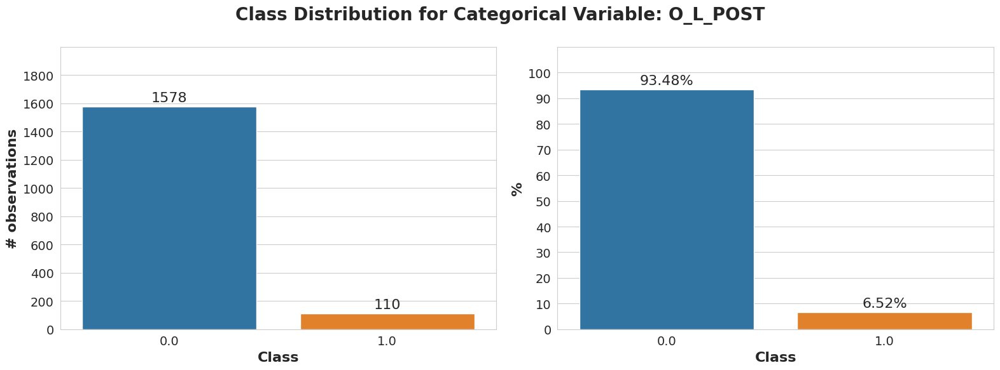

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_K_SH_POST.png


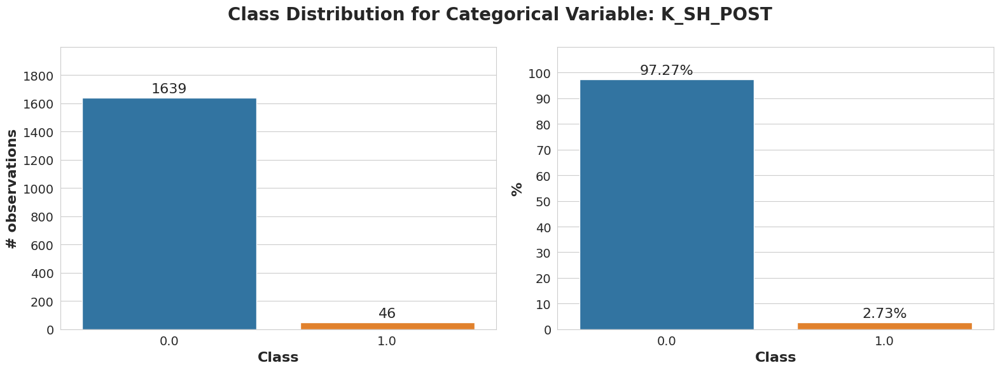

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_MP_TP_POST.png


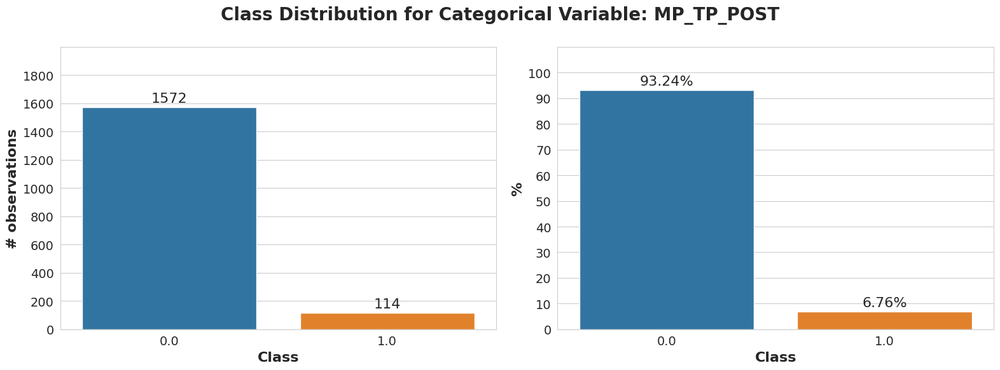

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_SVT_POST.png


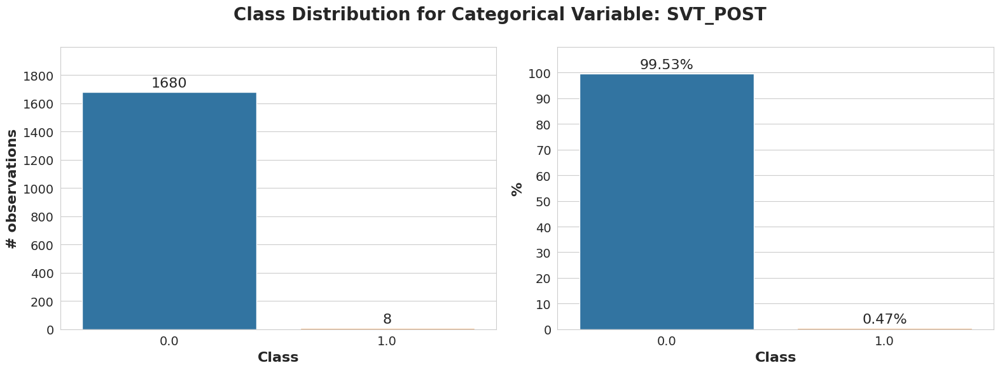

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_GT_POST.png


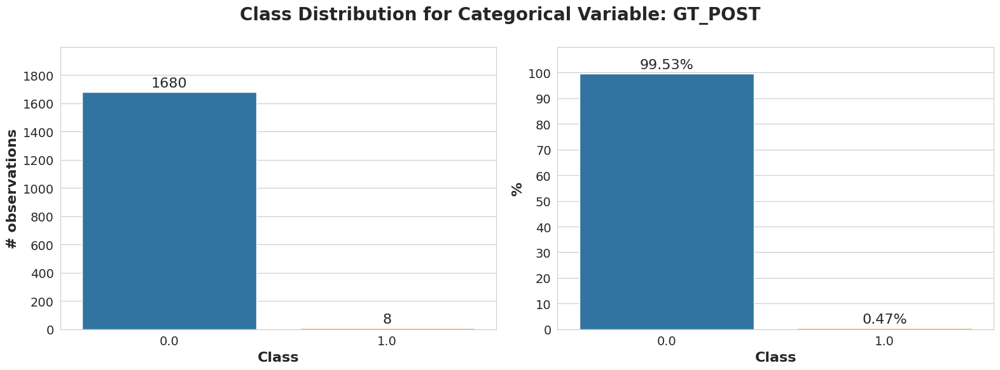

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_FIB_G_POST.png


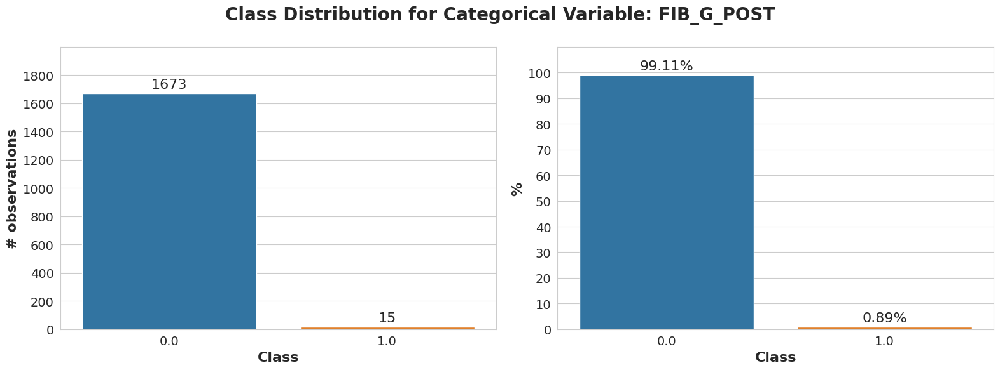

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_IM_PG_P.png


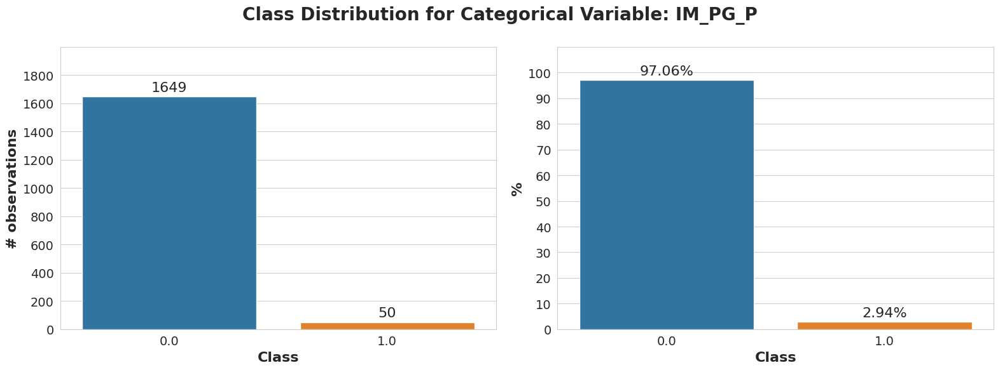

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_ritm_ecg_p_01.png


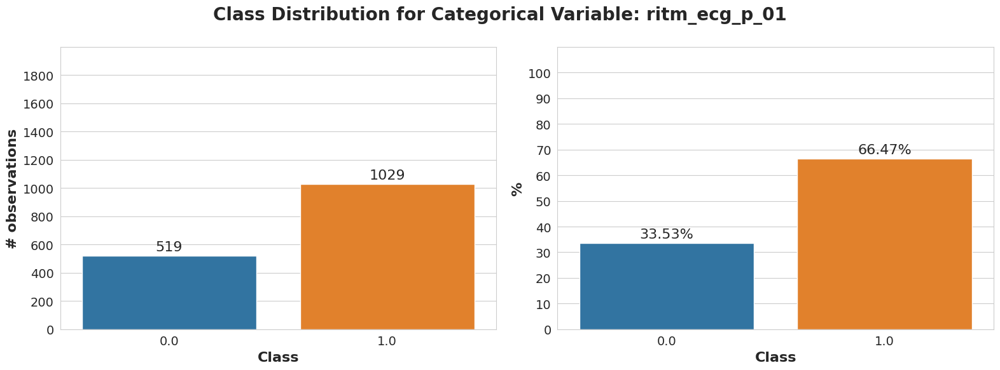

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_ritm_ecg_p_02.png


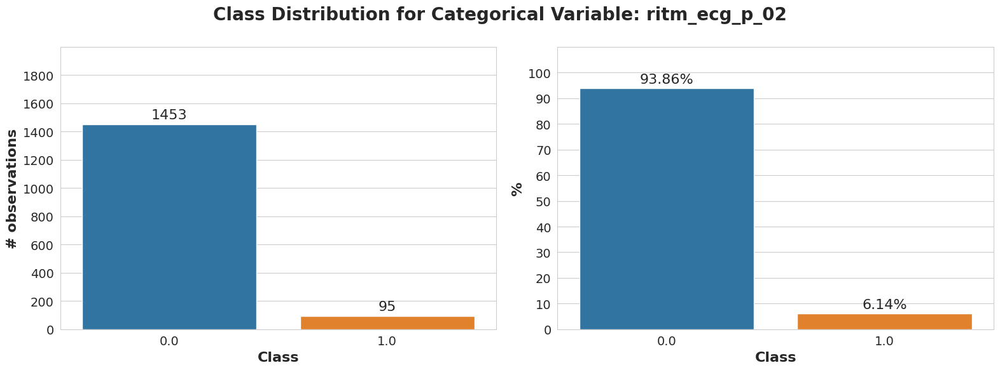

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_ritm_ecg_p_04.png


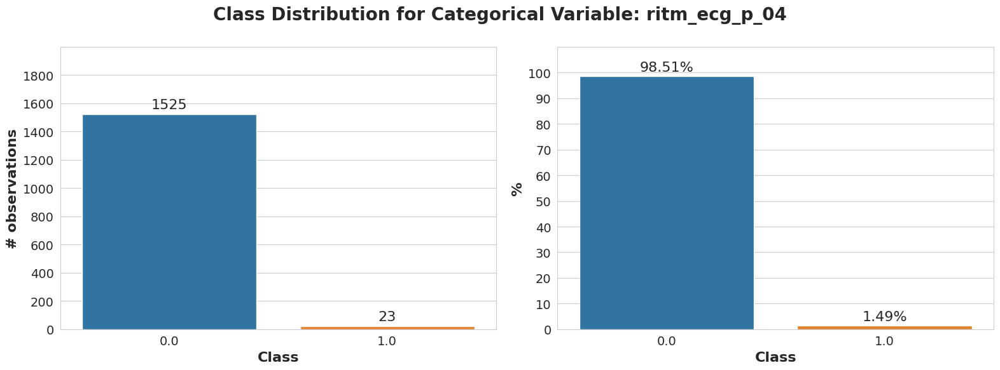

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_ritm_ecg_p_06.png


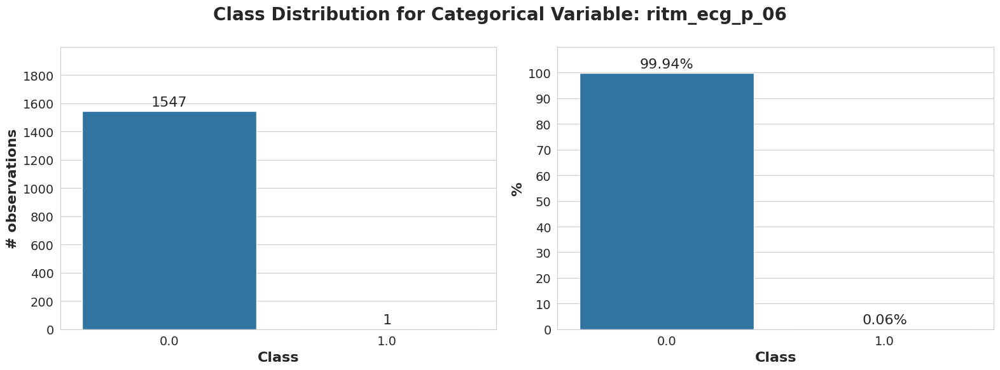

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_ritm_ecg_p_07.png


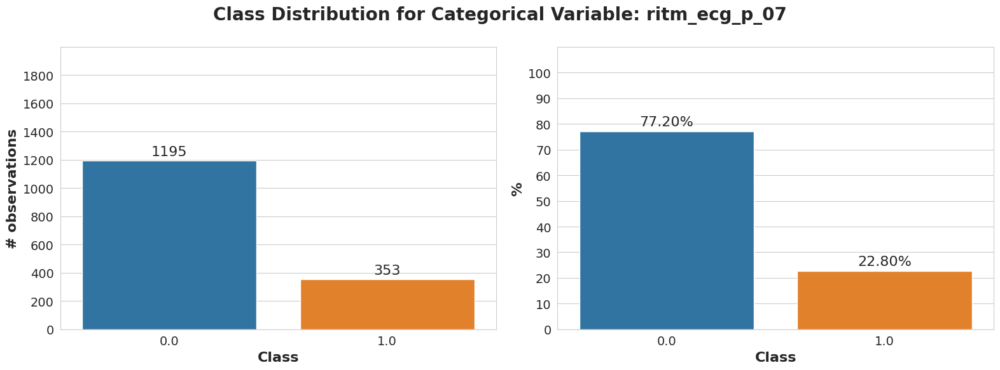

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_ritm_ecg_p_08.png


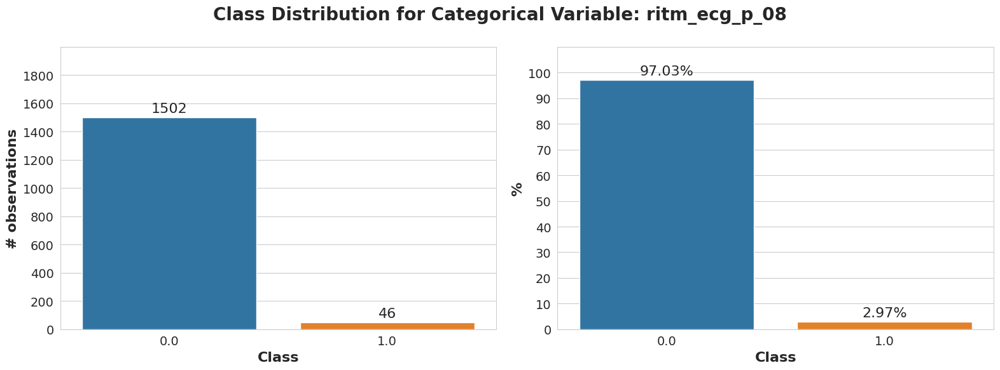

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_r_ecg_p_01.png


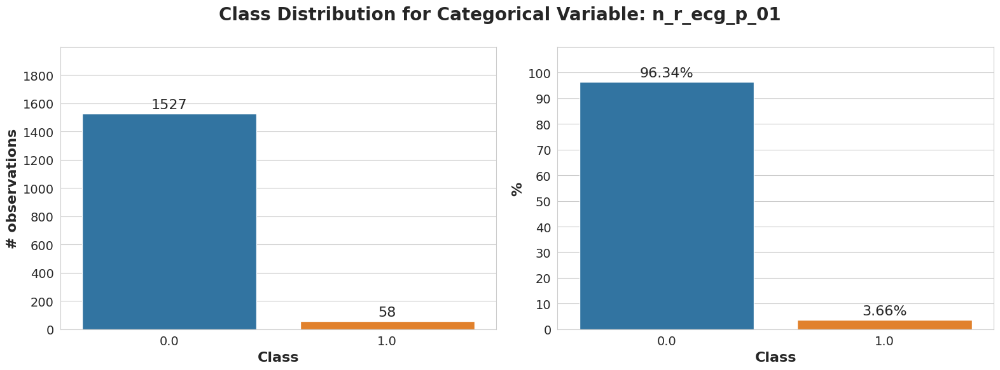

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_r_ecg_p_02.png


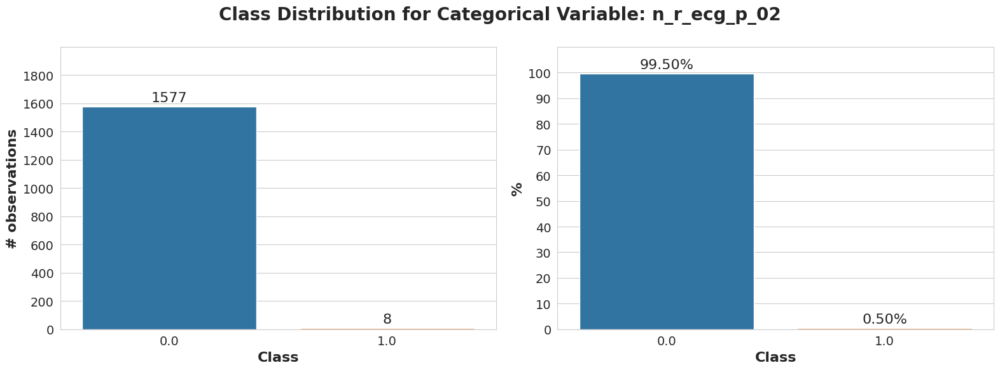

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_r_ecg_p_03.png


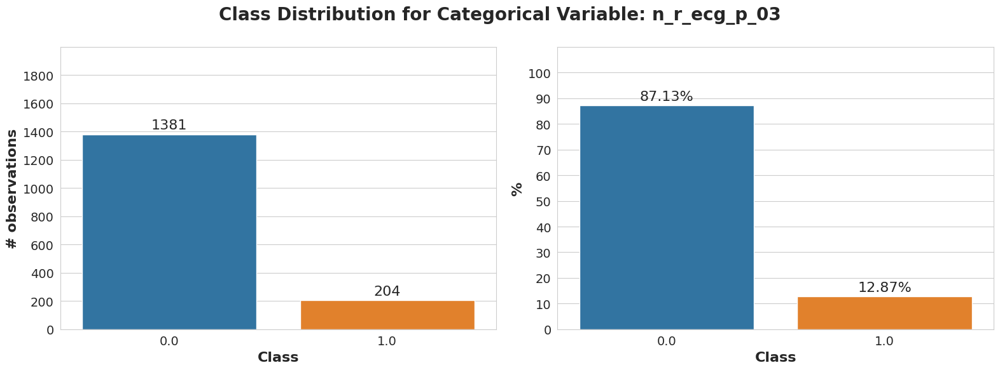

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_r_ecg_p_04.png


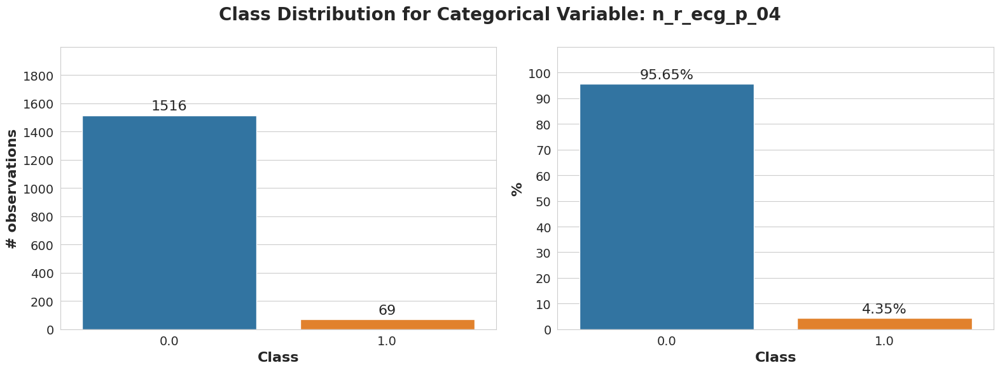

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_r_ecg_p_05.png


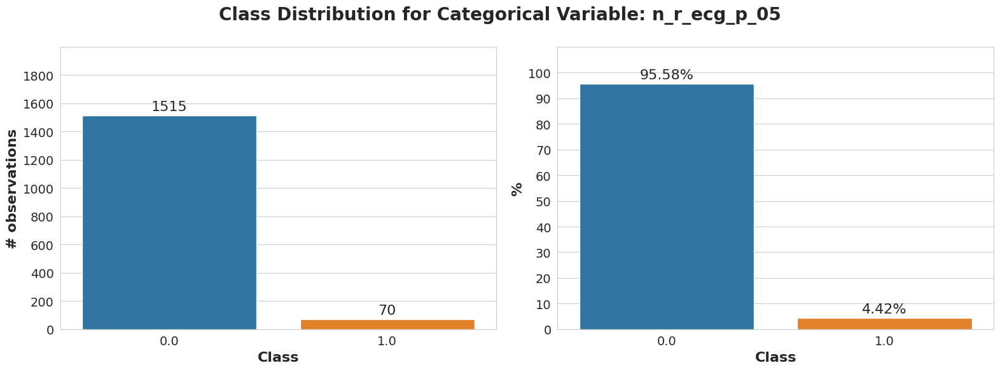

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_r_ecg_p_06.png


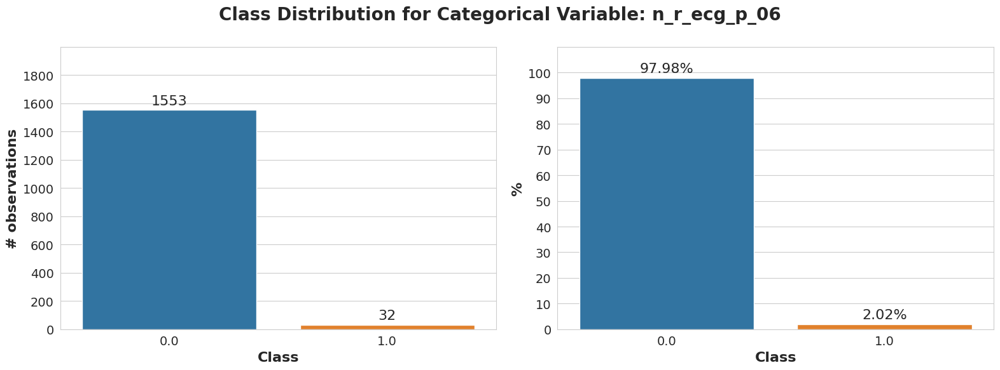

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_r_ecg_p_08.png


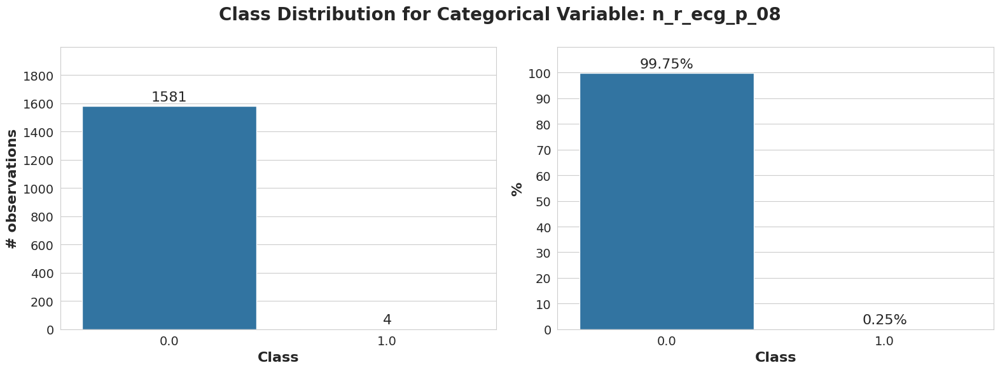

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_r_ecg_p_09.png


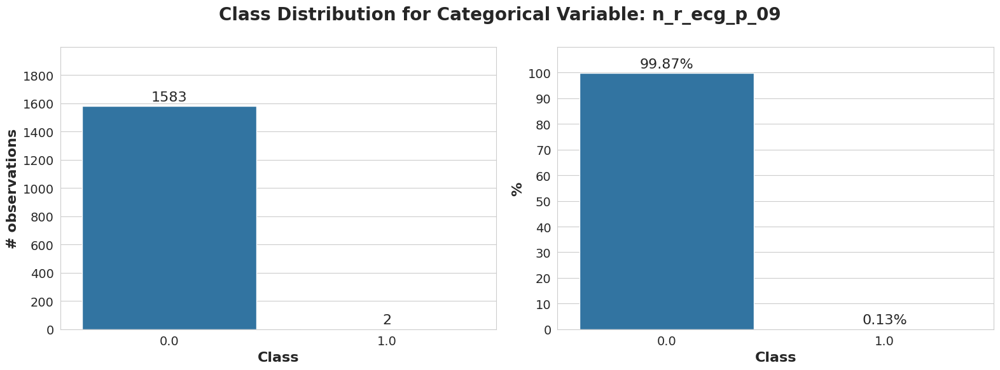

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_r_ecg_p_10.png


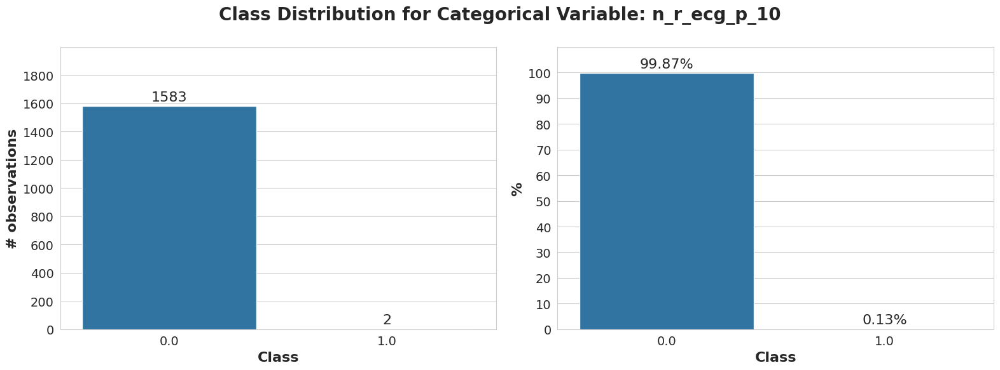

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_p_ecg_p_01.png


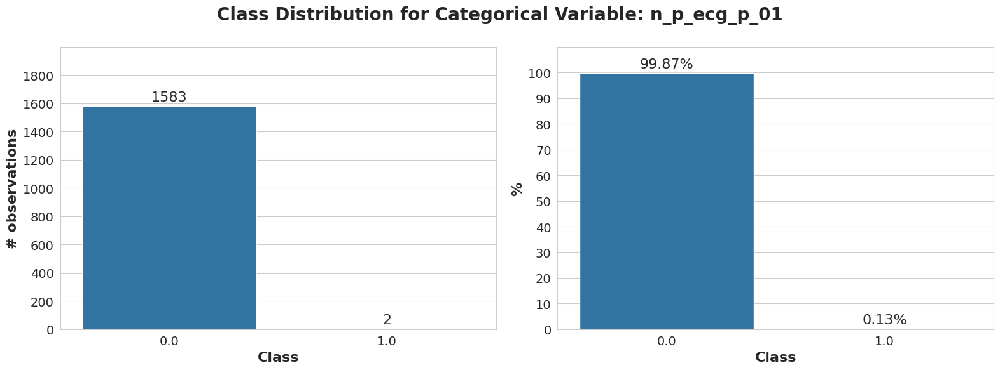

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_p_ecg_p_03.png


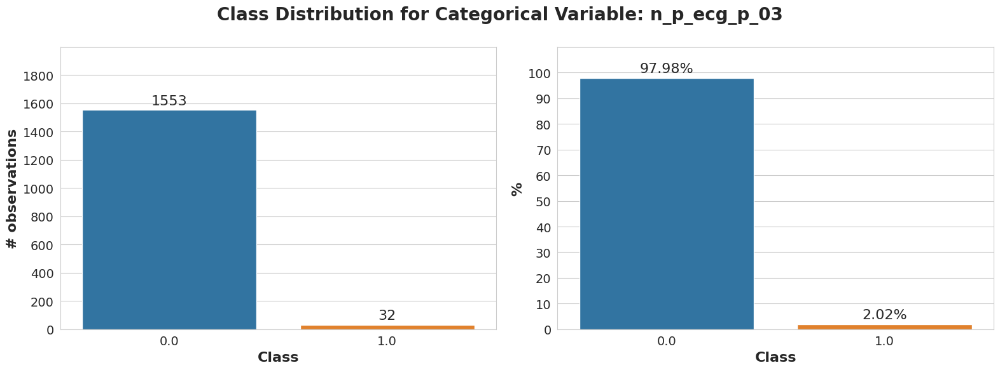

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_p_ecg_p_04.png


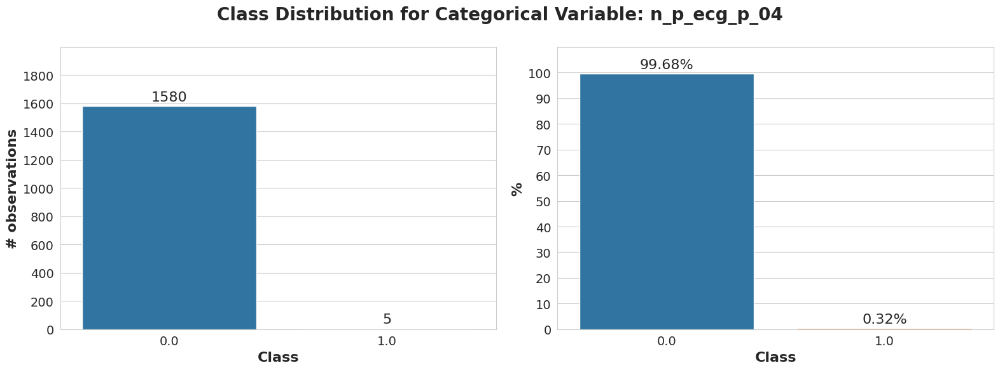

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_p_ecg_p_05.png


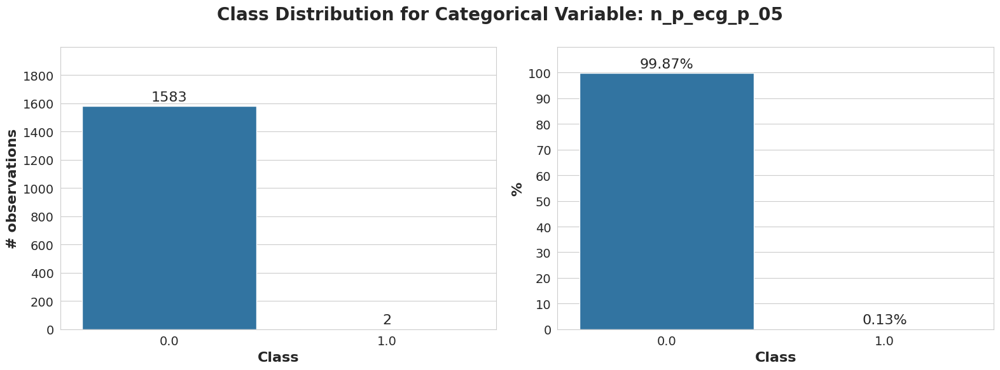

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_p_ecg_p_06.png


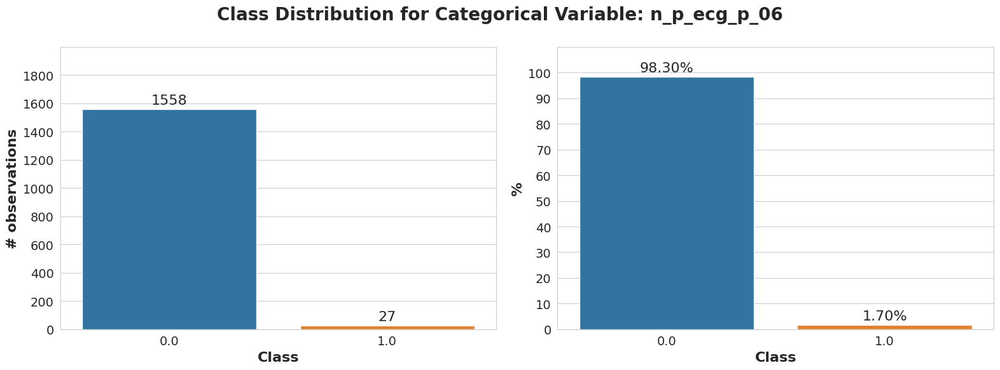

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_p_ecg_p_07.png


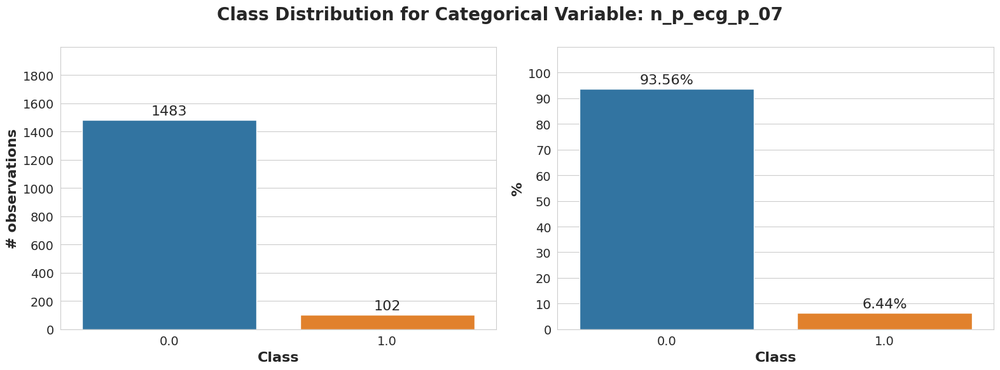

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_p_ecg_p_08.png


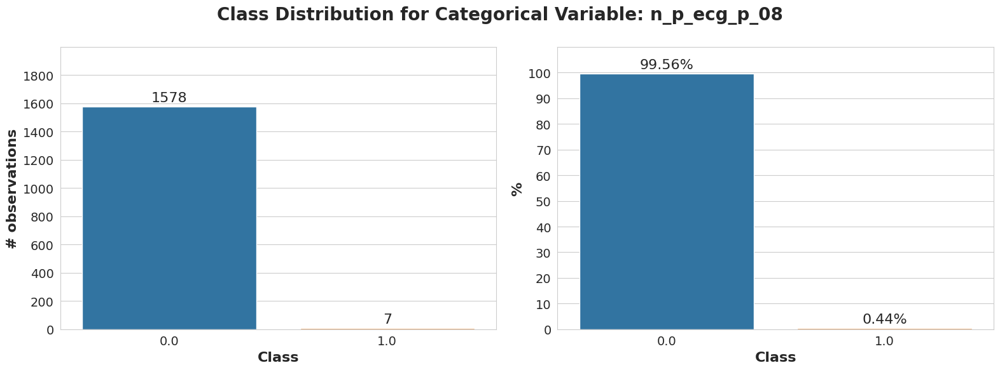

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_p_ecg_p_09.png


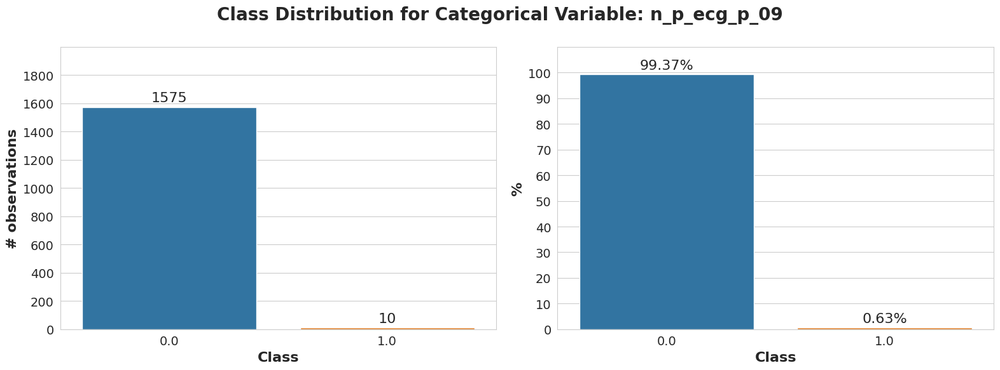

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_p_ecg_p_10.png


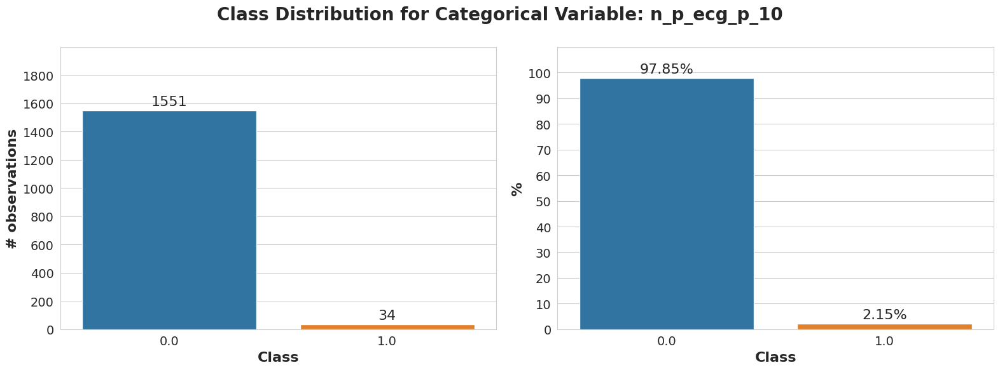

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_p_ecg_p_11.png


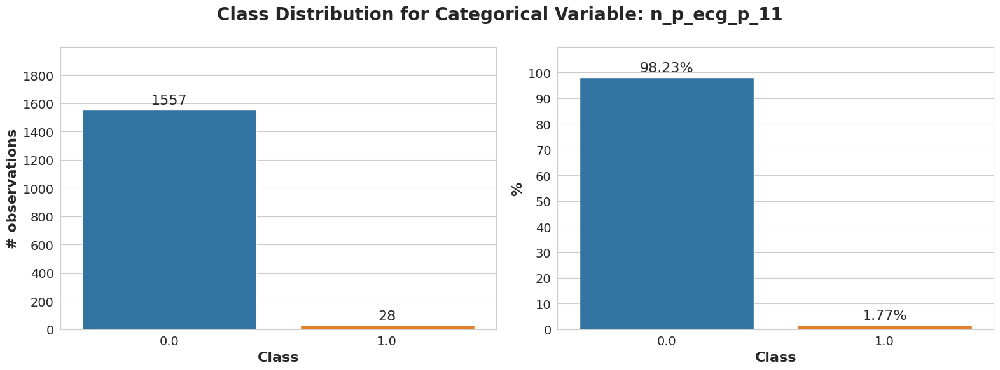

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_n_p_ecg_p_12.png


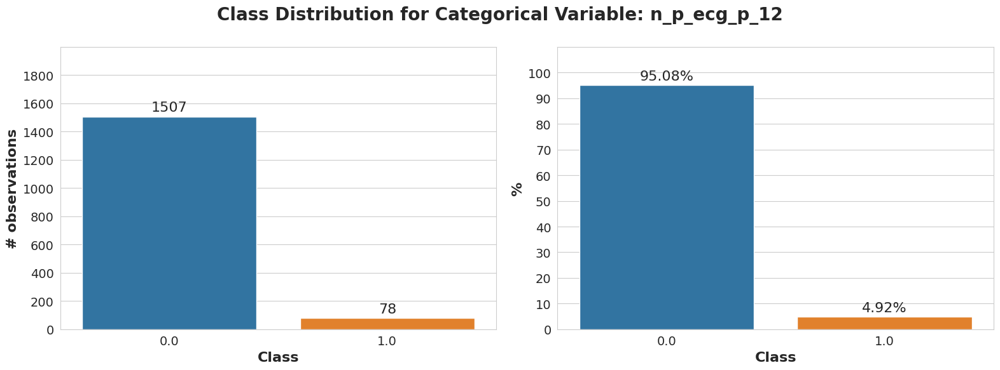

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_fibr_ter_01.png


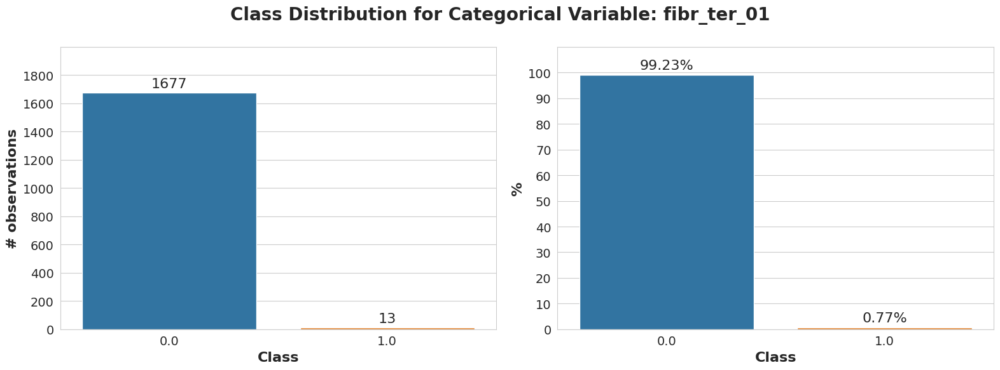

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_fibr_ter_02.png


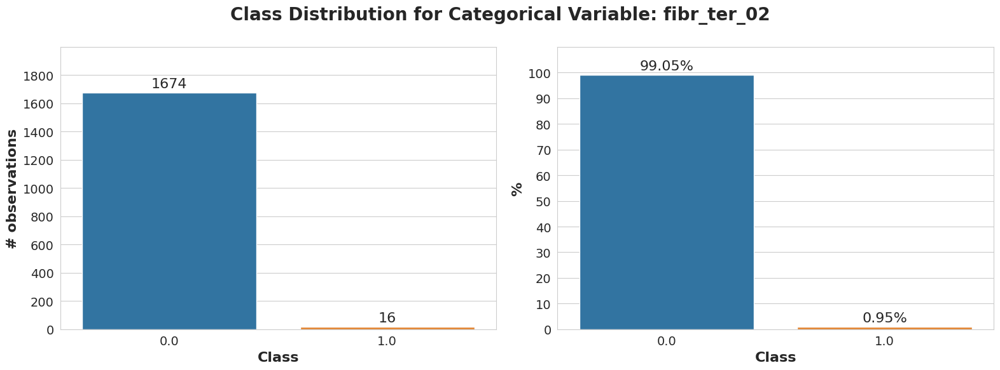

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_fibr_ter_03.png


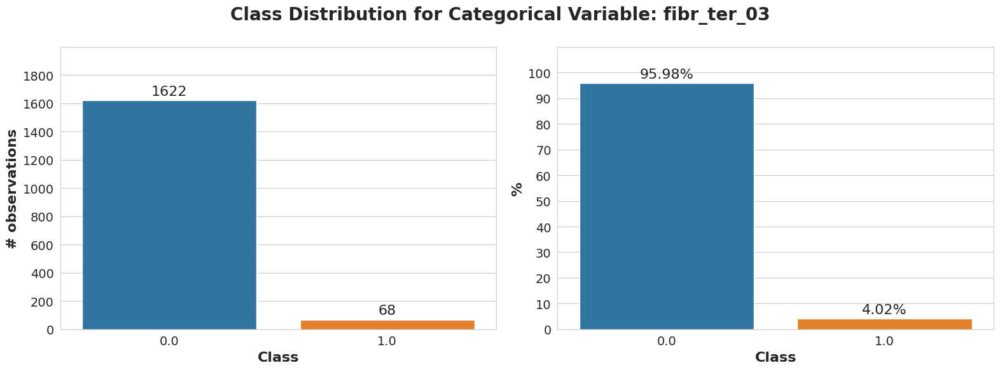

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_fibr_ter_05.png


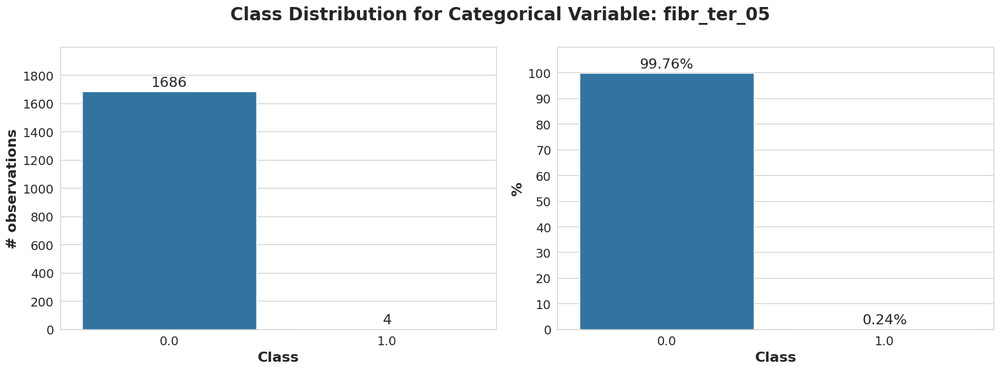

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_fibr_ter_06.png


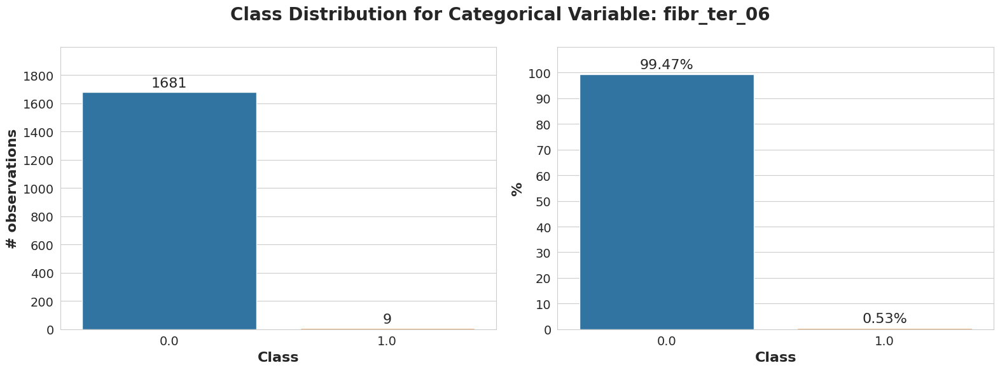

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_fibr_ter_07.png


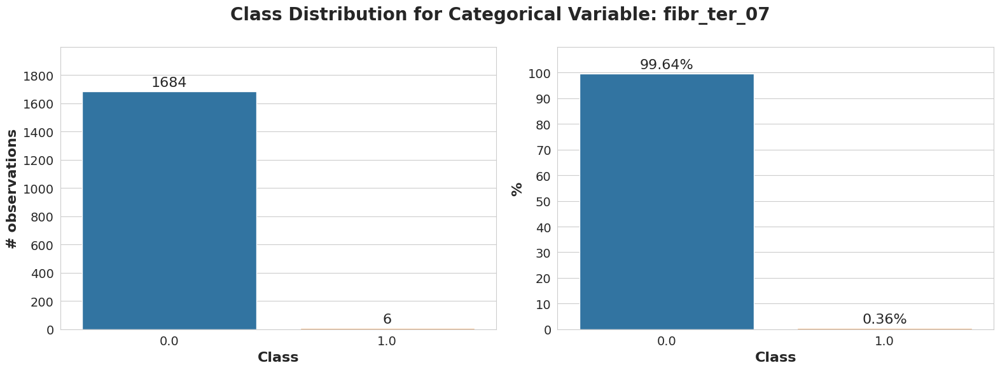

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_fibr_ter_08.png


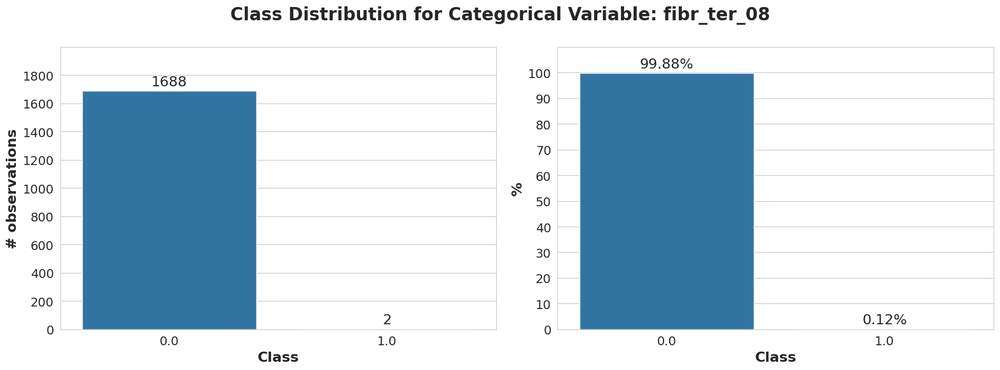

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_GIPO_K.png


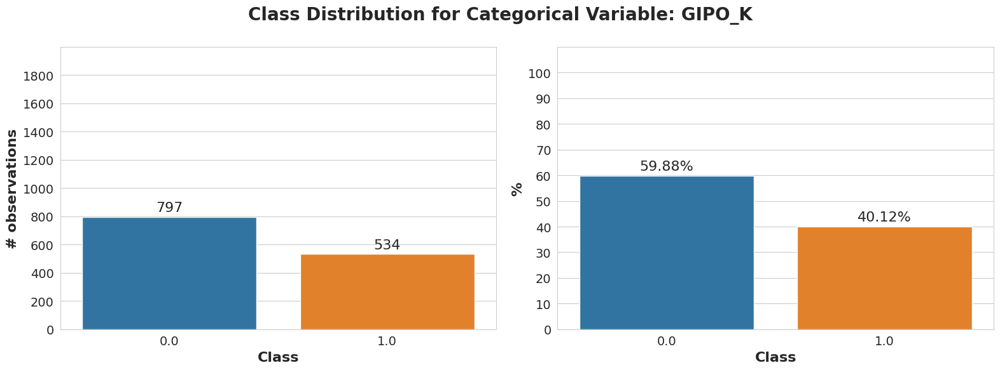

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_GIPER_NA.png


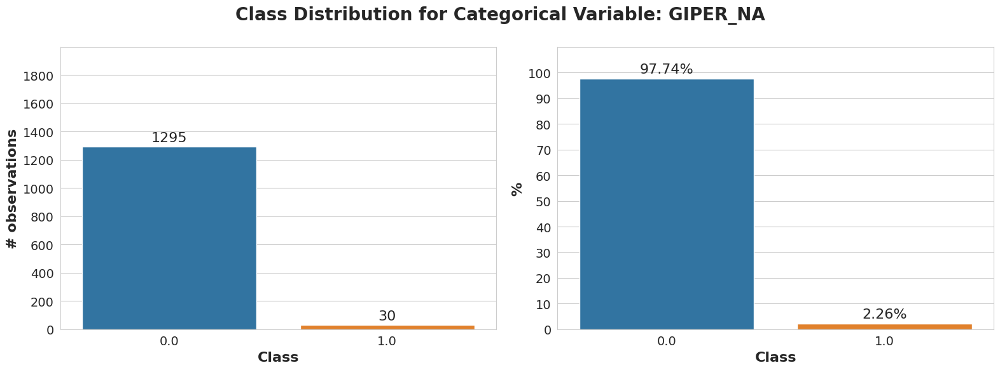

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_NA_KB.png


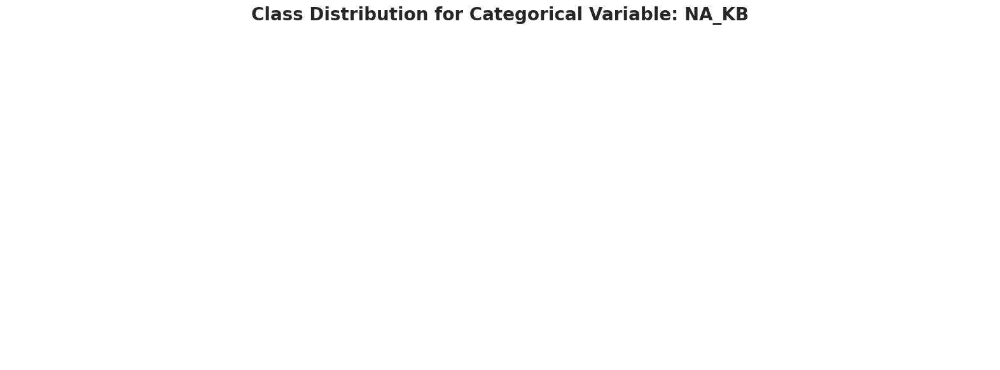

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_NOT_NA_KB.png


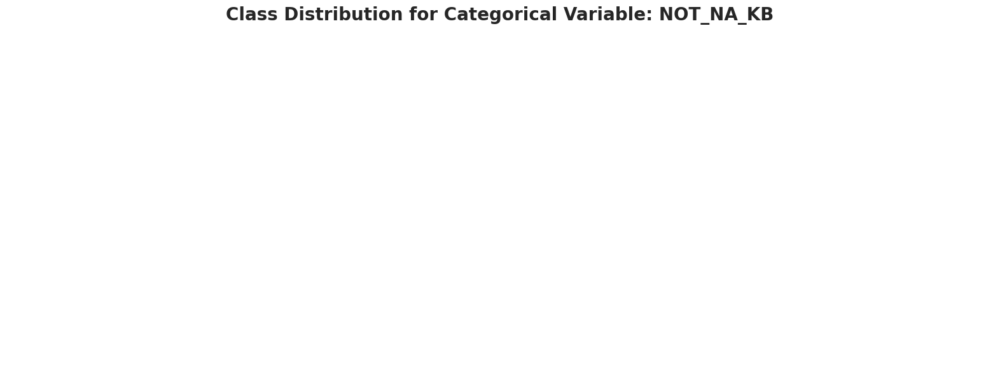

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_LID_KB.png


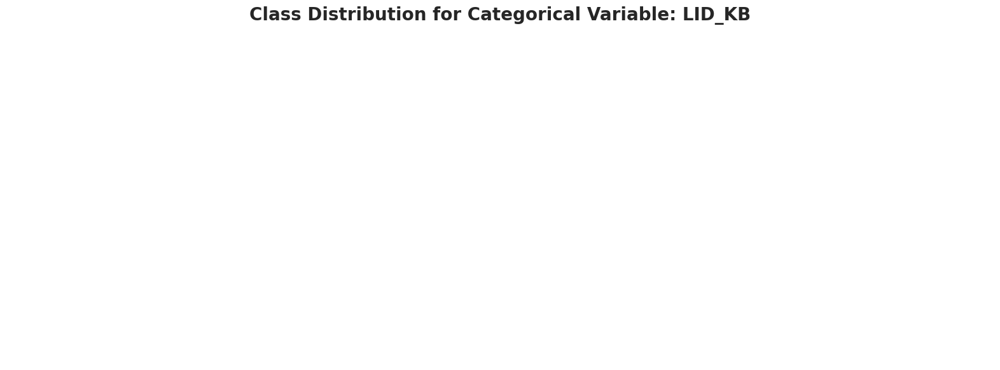

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_NITR_S.png


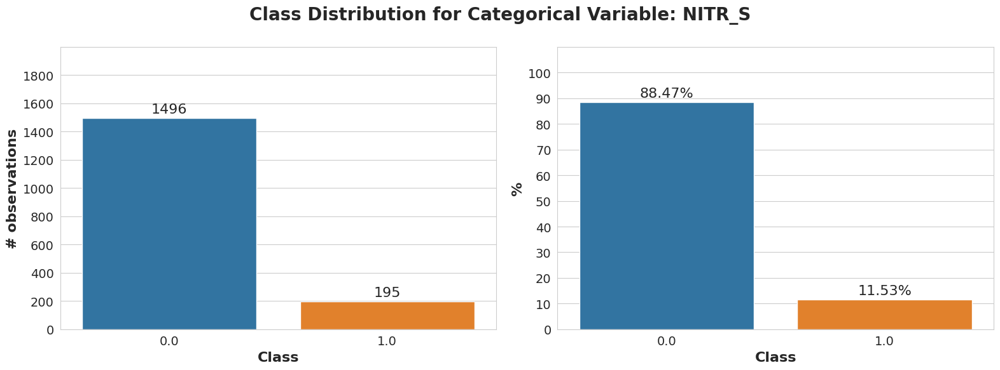

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_LID_S_n.png


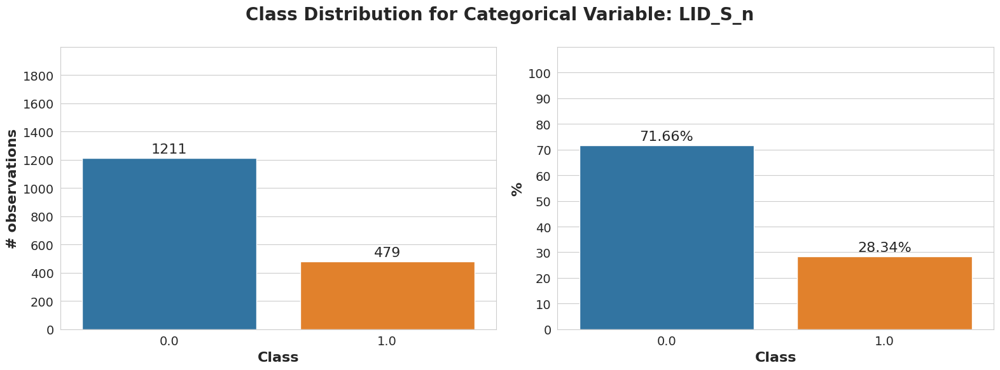

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_B_BLOK_S_n.png


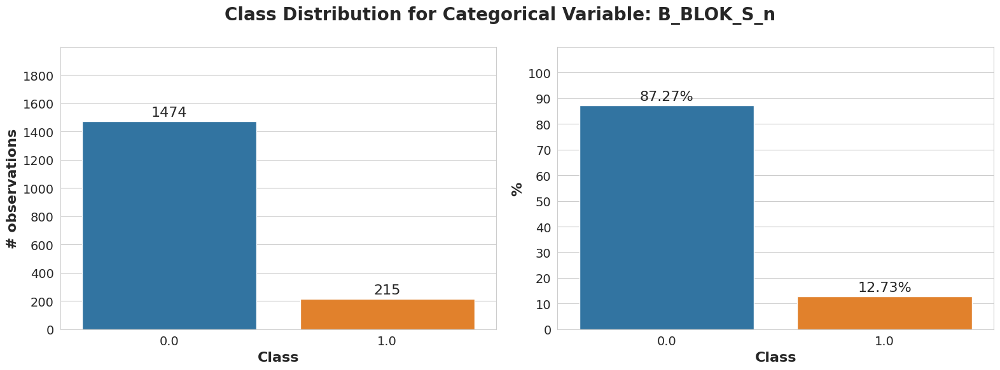

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_ANT_CA_S_n.png


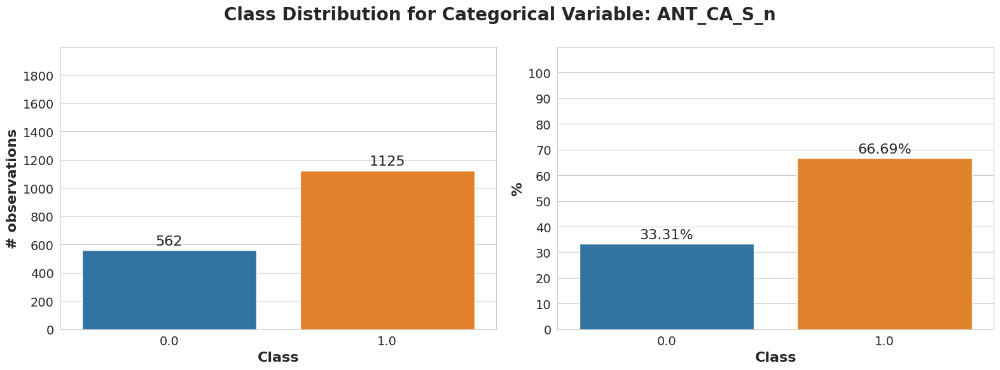

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_GEPAR_S_n.png


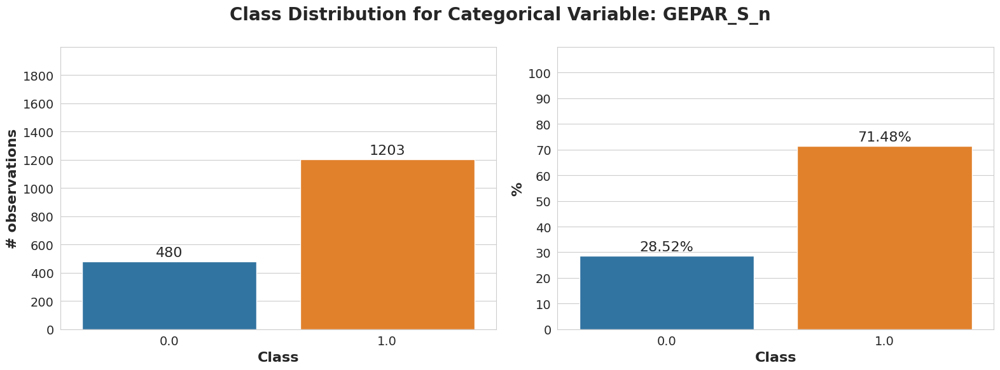

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_ASP_S_n.png


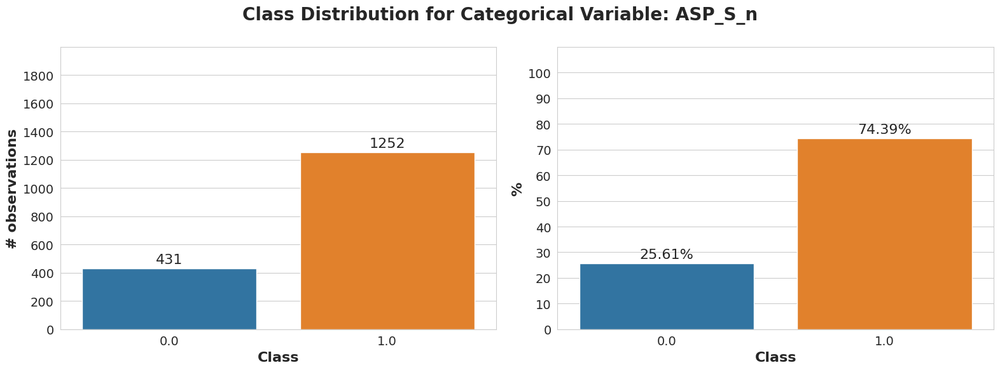

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_TIKL_S_n.png


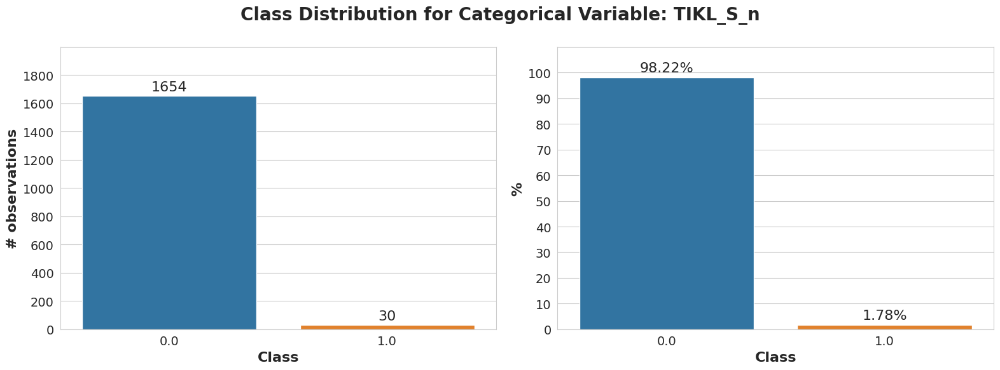

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_TRENT_S_n.png


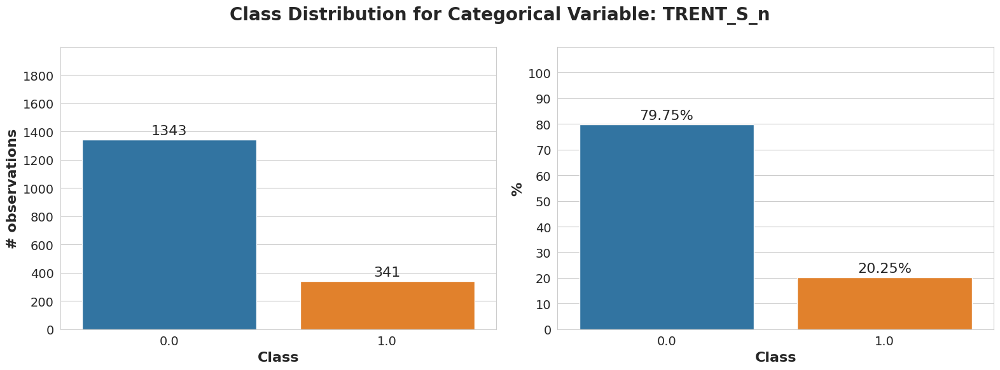

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_FIBR_JELUD.png


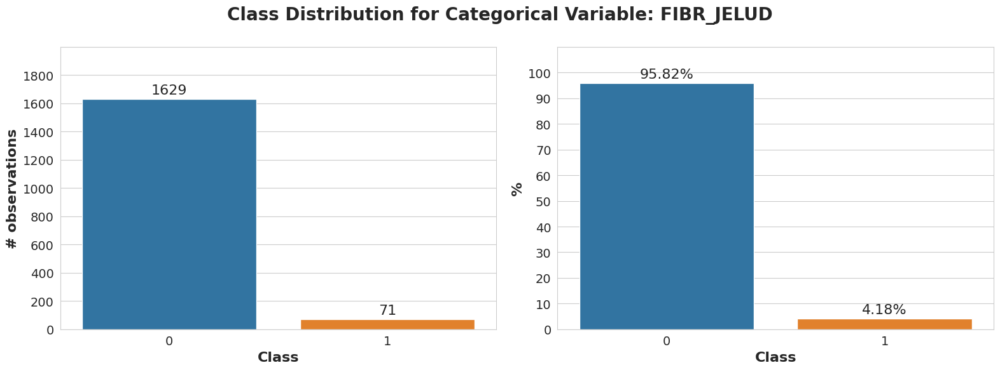

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_IBS_POST.png


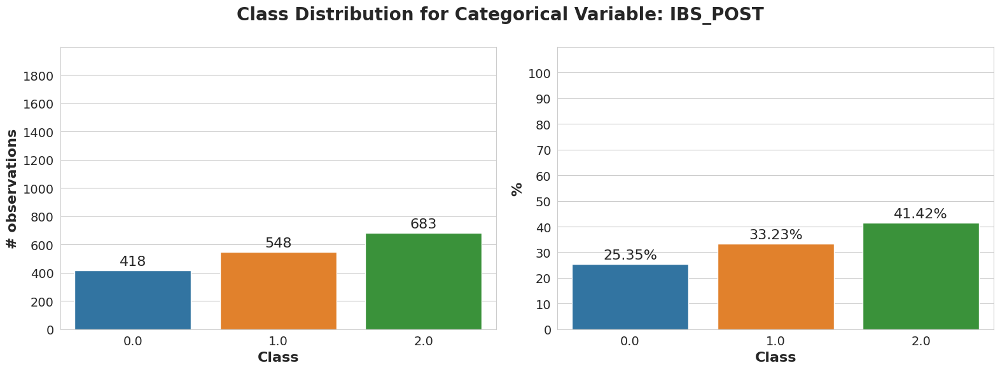

[SAVED] /home/leonardosaccotelli/Desktop/UNIVERSITA/MACHINE-LEARNING/Cost-Sensitive-Learning-For-Myocardial-Infarction-Mortality-Prediction/reports/figures/DU_data_exploration/class_distribution_absolute_vs_percentage_FIBR_JELUD.png


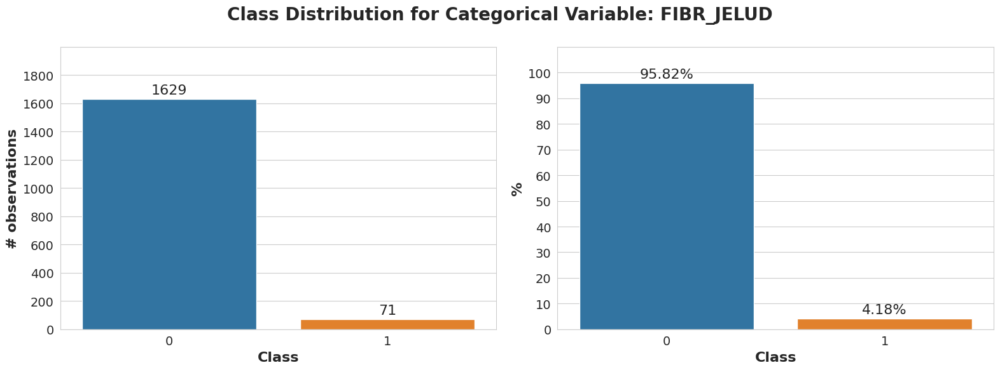

In [21]:
CATEGORICAL_FEATURES: list[str] = CATEGORICAL_ORDINAL_FEATURES + CATEGORICAL_NOMINAL_FEATURES

for cat_variable in CATEGORICAL_FEATURES:
    if cat_variable not in targets + ["CLASS"]:

        class_counts = df[cat_variable].value_counts().sort_index()
        total = class_counts.sum()
        class_percentages = class_counts / total * 100

        unique_x_ticks_label = df[cat_variable].unique()

        fig, axes = plt.subplots(1, 2, figsize=(16, 6))

        # ------- Subplot 1: Counting the observations per class
        sns.countplot(ax=axes[0],
                      data=df,
                      x=cat_variable,
                      hue=cat_variable,
                      legend=False)
        axes[0].set_xlabel("Class", fontweight="bold", fontsize=16)
        axes[0].set_ylabel("# observations", fontweight="bold", fontsize=16)
        axes[0].set_xticks(ticks=unique_x_ticks_label, labels=unique_x_ticks_label, fontsize=14)
        axes[0].set_yticks(ticks=np.arange(0, 2000, 200),
                           labels=np.arange(0, 2000, 200),
                           fontsize=14)
        axes[0].set_ylim(0, 2000)

        for container in axes[0].containers:
            axes[0].bar_label(container, fmt="%.0f", padding=3)

        axes[0].margins(y=0.1) # Avoid clipping labels at the top

        # ------- Subplot 2: Percentage per class
        sns.barplot(ax=axes[1],
                    x=class_percentages.index.astype(str),
                    y=class_percentages.values,
                    hue=class_percentages.index.astype(str))
        axes[1].set_xlabel("Class", fontweight="bold", fontsize=16)
        axes[1].set_ylabel("%", fontweight="bold", fontsize=16)
        axes[1].set_xticks(ticks=unique_x_ticks_label, labels=unique_x_ticks_label, fontsize=14)
        axes[1].set_yticks(ticks=np.arange(0, 110, 10),
                           labels=np.arange(0, 110, 10),
                           fontsize=14)
        axes[1].set_ylim(0, 110)

        for container in axes[1].containers:
            axes[1].bar_label(container, fmt="%.2f%%", padding=3)

        axes[1].margins(y=0.1)

        # ------- General settings
        plt.suptitle(f"Class Distribution for Categorical Variable: {cat_variable}", fontsize=20, fontweight="bold")
        plt.tight_layout()

        class_distribution_path: Path = FIGURES_DATA_EXPLORATION_DIR / f"class_distribution_absolute_vs_percentage_{cat_variable}.png"
        plt.savefig(class_distribution_path, dpi=300)
        print(f"[SAVED] {class_distribution_path}")

        plt.show()